# `Материалы кафедры ММП факультета ВМК МГУ. Введение в глубокое обучение.`

## `Задание 02. Сегментация изображений`

#### Фамилия, имя: Загатин Даниил

Дата выдачи: <span style="color:red">__3 марта 19:00__</span>.

Мягкий дедлайн: <span style="color:red">__17 марта 5:00__</span>.

Стоимость: __10 баллов__ (основная часть заданий) + __4.25 балла__ (дополнительные задания).

<span style="color:red">__В ноутбуке все клетки должны выполняться без ошибок при последовательном их выполнении.__</span>

#### `Москва, 2025`

В этом задании вы будете решать задачу сегментации людей на фотографии с помощью нейросетевых архитектур `U-Net` и `LinkNet`.

Данные для выполнения задания можно скачать по [ссылке](https://disk.yandex.ru/d/tI6d3LBMHTwOnw).

## `Загрузка данных (1 балл)`

Для загрузки данных pytorch опирается на такую сущность, как **`Dataset`**.

Этот абстрактный класс определен в `torch.utils.data.dataset`:

```python
class Dataset(object):
    """An abstract class representing a Dataset.

    All other datasets should subclass it. All subclasses should override
    ``__len__``, that provides the size of the dataset, and ``__getitem__``,
    supporting integer indexing in range from 0 to len(self) exclusive.
    """

    def __getitem__(self, index):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __add__(self, other):
        return ConcatDataset([self, other])
```
При определении нового источника данных мы создаем наследника данного класса и реализуем методы `__getitem__` и `__len__`.

Пример готового такого класса — `torchvision.datasets.ImageFolder`, который позволяет создать датасет на основе директории с ImageNet-подобной структурой поддиректорий (`./train/{class}` и `./val/{class}`):

```python
imagenet = torchvision.datasets.ImageFolder('path/to/imagenet_root/')
```

Реализуйте класс `PhotosDataset` для выданных данных.

**Внимание.** Возможно, стоит прочитать следующий пункт задания, чтобы реализация была удобной.

In [1]:
import os

import numpy as np
import numpy.testing as npt

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.models import vgg13, VGG13_Weights

import matplotlib_inline
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [2]:
class PhotosDataset(Dataset):
    def __init__(self, images_dir, target_dir=None, transforms=None):
        """
        Arguments
        ---------
        images_dir : str
            Path to directory with images

        target_dir : str
            Path to directory with masks.
            Each mask corresponds to one image.
            Corresponding mask and image have the same name, but different format.

        transforms : some collection
            Sequence of transformations for images and masks.
        """
        self.images_dir = images_dir
        self.target_dir = target_dir
        self.transforms = transforms

        self.image_filenames = sorted(os.listdir(images_dir))
        if target_dir:
            self.mask_filenames = sorted(os.listdir(target_dir))
        else:
            self.mask_filenames = None

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        """
        Arguments
        ---------
        idx : int
            Index of image and mask

        Returns
        -------
        (image, mask)
        """
        img_path = os.path.join(self.images_dir, self.image_filenames[idx])
        image = Image.open(img_path)
        if self.target_dir:
            mask_path = os.path.join(self.target_dir, self.mask_filenames[idx])
            mask = Image.open(mask_path)
        if self.transforms:
            for transform in self.transforms:
                image, mask = transform(image, mask)
        return image, mask

## `Модуль аугментации (2 балла)`

Конструктор стандартного `ImageFolder`, принимает параметр `transform` (и иногда `target_transform`).

Они служат для того, чтобы загружаемые изображения (обычно это `PIL.Image`) или таргеты преобразовывать в тензоры нужного вида.

В `torchvision` входит модуль `transforms` для стандартных примеров таких преобразований. В `transforms` могут содержаться случайные преобразования, это самый простой путь для реализации аугментации данных.

При определении кастомного трансформера помимо конструктора нужно реализовать лишь метод `__call__`:

```python
class HorizontalFlip(object):
    def __init__(self, mode=0):
        self.method = mode

    def __call__(self, img):
        """
        Args:
            img (PIL.Image): Image to be flipped.

        Returns:
            PIL.Image: Randomly flipped image.
        """
        if self.method:
            return img.transpose(Image.FLIP_LEFT_RIGHT)
        return img

```

С полным списком стандартных преобразований можно ознакомиться в [документации](https://pytorch.org/vision/0.12/transforms.html).

В данной части вам предлагается самостоятельно реализовать несколько кастомных трансформеров.
Обратите внимание, что для некоторых трансформеров, необходимо преобразовывать и изображение, и маску, а для каких-то только изображение.

Один из путей реализации:
* реализовать декоратор, делающий любое преобразование случайным
* реализовать декоратор, применяющий преобразование и к изображению, и к маске

Список трансформеров, которые надо реализовать:

1. случайное (с вероятностью $p$) горизонтальное отображение (flip) изображения
2. случайное (с вероятностью $p$) вырезание фрагмента изображения (заданного или случайного размера)
3. случайное (с вероятностью $p$) изменение яркости изображения (на заданную или случайную величину)
4. случайное (с вероятностью $p$) изменение фона изображения (на изображение из заданного списка изображений)

Используйте разумные пределы для аугментаций. Одной из причин плохого обучения модели могут быть слишком сильные аугментации. Визуально убедитесь, что граничные случаи достаточно адекватны задаче.

Обратите внимание, что под вырезанием фрагмента подрузумевается вырезания части изображения из исходного, то есть вырезание какой-то части изображения (создание отверстий в изображении). Если после слоя вырезания размеры изображения поменялись, то вы неправильно реализовали модуль.

In [3]:
import random
from PIL import Image, ImageDraw, ImageEnhance

def random_transform(p):
    def decorator(func):
        def wrapper(self, *args, **kwargs):
            if random.random() < p:
                return func(self, *args, **kwargs)
            return args[0], args[1]
        return wrapper
    return decorator

class RandomHorizontalFlip(object):
    def __init__(self):
      pass

    @random_transform(p=0.6)
    def __call__(self, img, mask):
        return img.transpose(Image.FLIP_LEFT_RIGHT), mask.transpose(Image.FLIP_LEFT_RIGHT)


class CutOutPatch(object):
    def __init__(self, patch_size=None, max_w=240, max_h=320):
        self.patch_size = patch_size
        self.max_w = max_w
        self.max_h = max_h

    @random_transform(p=0.6)
    def __call__(self, img, mask):
        img_copy = img.copy()
        mask_copy = mask.copy()
        draw_img = ImageDraw.Draw(img_copy)
        draw_mask = ImageDraw.Draw(mask_copy)
        width, height = img.size
        if self.patch_size is not None:
            patch_w, patch_h = self.patch_size
        else:
            patch_w = random.randint(10, min(width, self.max_w))
            patch_h = random.randint(10, min(height, self.max_h))
        x1 = random.randint(0, width - patch_w)
        y1 = random.randint(0, height - patch_h)
        x2, y2 = x1 + patch_w, y1 + patch_h
        draw_img.rectangle([x1, y1, x2, y2], fill=(0, 0, 0))
        draw_mask.rectangle([x1, y1, x2, y2], fill=0)
        return img_copy, mask_copy


class BrightChange(object):
    def __init__(self, bright_coeff=None):
        if bright_coeff is not None:
            self.bright_coeff = bright_coeff
        else:
            self.bright_coeff = random.uniform(0.2, 1.7)

    @random_transform(p=0.6)
    def __call__(self, img, mask):
        enhancer = ImageEnhance.Brightness(img)
        img_brighter = enhancer.enhance(self.bright_coeff)
        return img_brighter, mask


class RandomBackgroundReplace(object):
    def __init__(self, backgrounds_dir=None):
        self.backgrounds_dir = backgrounds_dir
        self.labels_backgrounds = sorted(list(os.listdir(backgrounds_dir)))

    @random_transform(p=0.6)
    def __call__(self, img, mask):
        idx = random.randint(0, len(self.labels_backgrounds) - 1)
        background = Image.open(os.path.join(self.backgrounds_dir, self.labels_backgrounds[idx]))
        background = background.resize(img.size)

        img_np, mask_np = np.array(img), np.array(mask)
        background_np = np.array(background)
        img_np[mask_np == 0] = background_np[mask_np == 0]

        return Image.fromarray(img_np), mask

Добавьте случайные преобразования в ваши датасеты. Также, добавьте преобразование в tensor и нормализацию для изображения:

```python
transforms.ToTensor()
transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)
```

Переопределим эти преобразования, так как в датасете преобразования вызываются и от изображения и от маски

In [4]:
from torchvision import transforms

class ToTensor(object):
    def __init__(self):
        pass

    def __call__(self, image, mask):
        return  transforms.ToTensor()(image), transforms.ToTensor()(mask)

class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, image, mask):
        return transforms.Normalize(mean=self.mean, std=self.std)(image), mask

In [5]:
BACKGROUNDS = '/kaggle/input/backgrounds/backgrounds'

In [6]:
DATA_PATH = '/kaggle/input/people-segmentation/people_data'

train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomHorizontalFlip(),
        RandomBackgroundReplace(BACKGROUNDS),
        CutOutPatch(max_w=100, max_h=150),
        BrightChange(),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )]
)

Функция для отображения изображения:

In [7]:
def show_idx_image(dataset, idx):
    image, mask = dataset[idx]

    image = image.permute(1, 2, 0).numpy()
    image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image = np.clip(image, 0, 1)

    mask = mask.squeeze(0).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(6, 4))

    axes[0].imshow(image)
    axes[1].imshow(mask)

    axes[0].set_axis_off()
    axes[1].set_axis_off()

    fig.tight_layout()
    plt.show()

Отобразите несколько изображений и масок, на которых будет видна правильная работа вашего модуля аугментации данных. Необходимо проверить каждый модуль аугментации отдельно, в ином случае будут сниматься баллы.

**Важно:** Проверьте корректность работы модулей, действительно ли маска изображения корректна для изображения после аугментации.

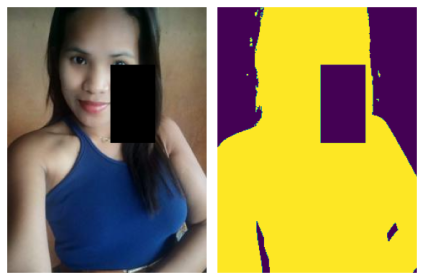

In [9]:
show_idx_image(train_dataset, 262)

### Проверка RandomHorizontalFlip

In [10]:
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomHorizontalFlip(),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

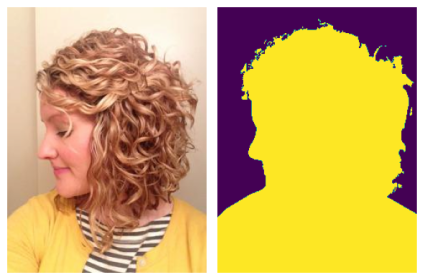

In [11]:
show_idx_image(train_dataset, 5)

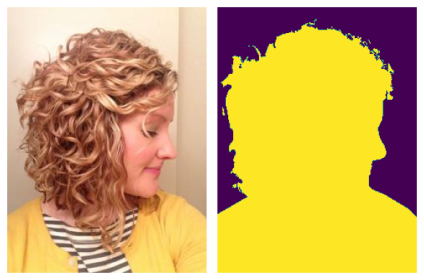

In [12]:
show_idx_image(train_dataset, 5)

### Проверка RandomBackgroundReplace

Я выбрал такие изображения для заднего фона, чтобы встречались как однотонные (например, небо), так и со множеством предметов на заднем плане (улица города), а также с изображениями других людей (чтобы подзапутать алгоритм). Таким образом в выборке изображений для заднего фона собраны наиболее встречающиеся фоны на фотографиях людей.

In [13]:
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomBackgroundReplace(BACKGROUNDS),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

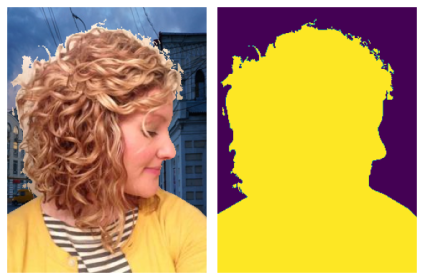

In [15]:
show_idx_image(train_dataset, 5)

### Проверка CutOutPatch

In [16]:
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        CutOutPatch(max_w=100, max_h=150),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

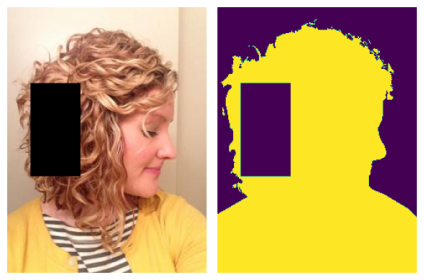

In [30]:
show_idx_image(train_dataset, 5)

### Проверка BrightChange

In [31]:
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        BrightChange(),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

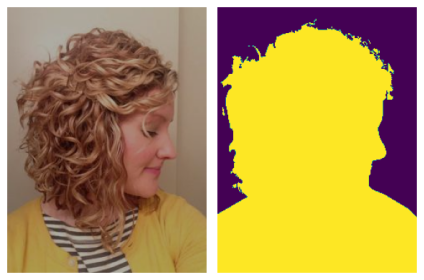

In [32]:
show_idx_image(train_dataset, 5)

### Проверка всех вместе

In [33]:
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomHorizontalFlip(),
        RandomBackgroundReplace(BACKGROUNDS),
        CutOutPatch(max_w=100, max_h=150),
        BrightChange(),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )]
)

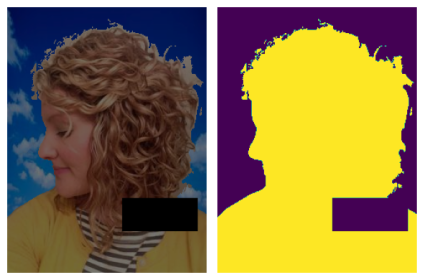

In [34]:
show_idx_image(train_dataset, 5)

## `Загрузчики`

При обучении сети удобнее работать не с датасетами, а с загрузчиками. Загрузчики создаются на основе датасета и позволяют итерироваться по батчам из него.

Обратите внимание на параметры `DataLoader`. При `num_workers`$\;> 1$, батчи готовятся (загружаются картинки, обрабатываются и так далее) сразу в нескольких фоновых процессах. С помощью параметра `shuffle` можно подавать картинки на обучение в случайном порядке.

Обычно, скорость обработки данных на GPU превышает скорость загрузки данных в одном процессе, поэтому типичное значение для `num_workers`$\approx 3\text{-}10$.

Учтите, что на некоторых системах в Jupyter Notebook при `num_workers`$>0$ `DataLoader` перестаёт работать. В таком случае установите это значение в $0$.

In [36]:
test_data_loader = DataLoader(test_dataset, batch_size=8, num_workers=3)
train_data_loader = DataLoader(train_dataset, batch_size=8, num_workers=3, shuffle=True)

## `DiceLoss (1 балл)`

Функция потерь реализовывается как и все стандартные нейронные модули в pytorch, через `torch.nn.Module`. В ячейке ниже вам предлагается реализовать функцию потерь `dice` (аналог меры Жаккарда).

Результат **Dice Loss** определим как:

$$
\text{Dice Coefficient} = 2\frac{|A \cap B| }{|A| + |B|} \leadsto \text{Dice Loss} = 1 - \frac{2\sum\limits_{i, j}a_{ij}b_{ij}}{\sum\limits_{ij}(a_{ij} + b_{ij} + \varepsilon)}
$$

где $a_{ij} \in [0, 1]$ — предсказанная вероятность нахождения человека в пикселе изображения, $b_{ij}$ — истинная разметка для пикселя изображения.

In [8]:
class DiceLoss(torch.nn.Module):
    def __init__(self, eps=1e-7, reduction=None, with_logits=True):
        """
        Arguments
        ---------
        eps : float
            eps in denominator
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:

            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed.
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()
        self.eps = eps
        self.reduction = reduction
        self.with_logits = with_logits

    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        true_labels = true_labels.to(torch.long)

        if self.with_logits:
            # your code here
            logits = torch.sigmoid(logits)

        # your code here
        intersec = 2 * torch.sum(logits * true_labels, dim=(-2, -1))
        sum = torch.sum(logits + true_labels + self.eps, dim=(-2, -1))

        if self.reduction == 'sum':
            # your code here
            loss_value = torch.sum(1 - intersec / sum)
        elif self.reduction == 'mean':
            # your code here
            loss_value = torch.mean(1 - intersec / sum)
        elif self.reduction is None:
            # your code here
            loss_value = 1 - intersec / sum

        return loss_value

Проверка реализации:

In [9]:
logits = torch.tensor([
    [[0, 0.5], [0.5, 1]],
    [[0.1, 0.1], [0, 0]],
])

target = torch.tensor([
    [[0, 1], [1, 1]],
    [[1, 0], [0, 1]],
])

losses = DiceLoss(with_logits=False, reduction=None, eps=1e-7)(logits, target)
npt.assert_almost_equal(losses.numpy(), np.array([0.2, 0.90909]), decimal=4)

loss = DiceLoss(with_logits=False, reduction='mean', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 0.554545, decimal=4)

loss = DiceLoss(with_logits=False, reduction='sum', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 1.10909, decimal=4)

## `U-Net (3 балла)`

Для решения задачи сегментации будем использовать [U-Net](https://arxiv.org/pdf/1505.04597.pdf) с энкодером из первых блоков предобученного `VGG13`.

Концептуальная схема представлена на диаграмме ниже:

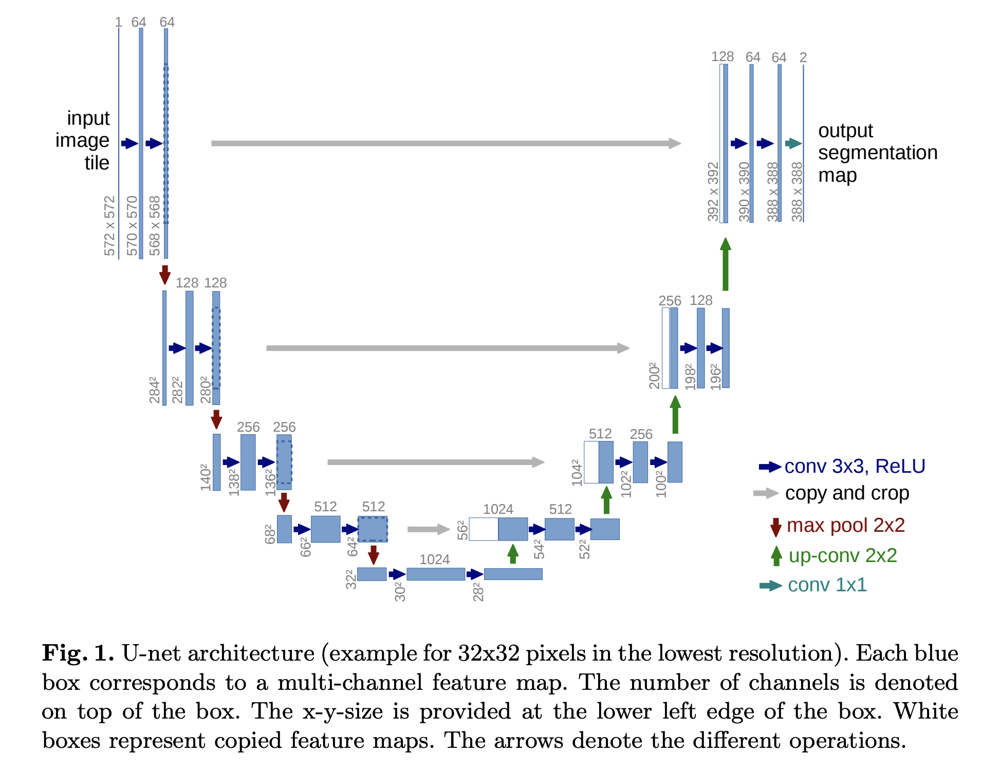

Заметим, что блоки VGG13 имеют следующий вид:
```python
    (0): Conv2d(...)
    (1): ReLU(...)
    (2): Conv2d(...)
    (3): ReLU(...)
    (4): MaxPool2d(...)
```

Для удобства, уберём слои `MaxPool2d` из блоков энкодера и будем применять pooling отдельно. Возможно, вам будет полезно вывести архитектуру модели `VGG` и изучить параметры слоев pooling.

При реализации `Decoder` вам пригодится интерполяция, для этого можно использовать `torch.nn.functional.interpolate` с `mode=nearest`.

Реализуйте архитектуру данной сети.

#### `Encoder`

In [9]:
vgg13(weights=VGG13_Weights.DEFAULT).features

Downloading: "https://download.pytorch.org/models/vgg13-19584684.pth" to /root/.cache/torch/hub/checkpoints/vgg13-19584684.pth
100%|██████████| 508M/508M [00:06<00:00, 80.7MB/s] 


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (15): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (16): ReLU(inplace=True)
  (17): Conv2d(512, 512, kernel_si

In [10]:
class VGG13Encoder(torch.nn.Module):
    def __init__(self, num_blocks, weights=VGG13_Weights.DEFAULT):
        super().__init__()
        self.num_blocks = num_blocks

        # Будем использовать предобученную VGG13 в качестве backbone
        feature_extractor = vgg13(weights=weights).features

        for module in feature_extractor:
            if isinstance(module, torch.nn.ReLU):
                module.inplace = False

        # Каждый блок энкодера U-Net — это блок VGG13 без MaxPool2d
        self.blocks = torch.nn.ModuleList()
        for idx in range(self.num_blocks):
            # Возьмите нужные слои из `feature_extractor` для очередного U-Net блока
            # Объедините их с помощью `torch.nn.Sequential`
            self.blocks.append(
                # your code here
                torch.nn.Sequential(
                    *[feature_extractor[idx * 5 : idx * 5 + 4]]
                )
            )

    def forward(self, x):
        activations = []
        for idx, block in enumerate(self.blocks):
            # Примените очередной блок U-Net
            # your code here
            x = block(x)

            # Сохраните активации для передачи их в декодер
            # your code here
            activations.append(x)

            # При необходимости примените max-pool
            # Можно использовать `torch.functional.F.max_pool2d`
            # your code here
            x = torch.functional.F.max_pool2d(x, kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

        return activations

In [12]:
assert sum((param.numel() for param in VGG13Encoder(num_blocks=1).parameters())) == 38720
assert sum((param.numel() for param in VGG13Encoder(num_blocks=2).parameters())) == 260160
assert sum((param.numel() for param in VGG13Encoder(num_blocks=3).parameters())) == 1145408

x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)
out = VGG13Encoder(num_blocks=3)(x)

assert len(out) == 3
npt.assert_almost_equal(torch.linalg.norm(out[0]).item(), 902.218, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[1]).item(), 571.030, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[2]).item(), 648.068, decimal=3)

#### `Decoder`

In [11]:
class DecoderBlock(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = torch.nn.ReLU(inplace=False)

    def forward(self, down, left):
        # Upsample x2 и свёртка
        # your code here
        x = torch.nn.functional.interpolate(down, scale_factor=2, mode="nearest")
        x = self.upconv(x)

        # Конкатенация выхода энкодера и предыдущего блока декодера
        # your code here
        x = torch.cat([x, left], dim=1)

        # Две свёртки с ReLu
        # your code here
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)

        return x

In [12]:
class Decoder(torch.nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        self.blocks = torch.nn.ModuleList()
        for idx in range(num_blocks):
            self.blocks.insert(0, DecoderBlock(num_filters * 2 ** idx))

    def forward(self, acts):
        up = acts[-1]
        for block, left in zip(self.blocks, acts[-2::-1]):
            up = block(up, left)
        return up

#### `U-Net`

In [13]:
class UNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_blocks=4):
        super().__init__()
        # your code here
        self.encoder = VGG13Encoder(num_blocks)

        # your code here
        self.decoder = Decoder(64, num_blocks - 1)

        # Свёртка 1x1 для попиксельной агрегации каналов
        # your code here
        self.final = torch.nn.Conv2d(
            in_channels=64, out_channels=1,
            kernel_size=1)
    def forward(self, x):
        # your code here
        acts = self.encoder.forward(x)
        x = self.decoder.forward(acts)
        x = self.final(x)

        return x

In [45]:
model = UNet(num_classes=1, num_blocks=3)
x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)

assert sum((param.numel() for param in model.parameters())) == 2067649
assert list(model(x).shape) == [1, 1, 320, 240]
model

UNet(
  (encoder): VGG13Encoder(
    (blocks): ModuleList(
      (0): Sequential(
        (0): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU()
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): ReLU()
        )
      )
      (1): Sequential(
        (0): Sequential(
          (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (6): ReLU()
          (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (8): ReLU()
        )
      )
      (2): Sequential(
        (0): Sequential(
          (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (11): ReLU()
          (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (13): ReLU()
        )
      )
    )
  )
  (decoder): Decoder(
    (blocks): ModuleList(
      (0): DecoderBlock(
        (upconv): Conv2d(256, 12

### `Оценивание качества сети`


Обычно, оптимизируемый функционал сложно интерпретировать, а так же в разных экспериментах могут использоваться разные функции потерь. Поэтому необходимо замерять и отслеживать независимую метрику качества. Предлагается использовать **IoU (Intersection over Union)** — один из стандартных вариантов для задачи сегментации:
$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|} = \frac{\sum\limits_{ij}a_{ij}b_{ij}}{\sum\limits_{ij}a_{ij} + b_{ij} - a_{ij}b_{ij}}
$$

Учтите, что знаменатель может быть равен нулю, например, если маска нулевая. Такие объекты можно не учитывать при агрегации и пропускать, так как в ином случае подсчет метрики на всем батче будет NaN. В pytorch есть встроенные для этого функции с префиксом nan.


In [14]:
class IoUScore(torch.nn.Module):
    def __init__(self, threshold, reduction=None):
        """
        Arguments
        ---------
        threshold : float
            threshold for logits binarization
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:

            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed.
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()

        self.threshold = threshold
        self.reduction = reduction

    @torch.no_grad()
    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        # your code here
        predict = (logits > self.threshold).float()
        intersec = torch.sum(predict * true_labels, dim=(-2, -1))
        union = torch.sum(predict + true_labels, dim=(-2, -1)) - torch.sum(predict * true_labels, dim=(-2, -1))
        score = intersec / union
        score[union == 0] = float('nan')

        if self.reduction == 'sum':
            # your code here
            score = torch.nansum(score)
        elif self.reduction == 'mean':
            # your code here
            score = torch.nanmean(score)

        return score

In [18]:
logits = torch.tensor([
    [
        [0.3089,  0.4311, -0.9711],
        [0.9030,  1.0325, -0.7607],
        [0.9648, -0.5528, -1.1010]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ]
])
true_labels = torch.tensor([
    [
        [0., 1., 0.],
        [1., 0., 0.],
        [0., 0., 1.]
    ], [
        [1., 1., 1.],
        [1., 0., 1.],
        [1., 0., 0.]
    ], [
        [1., 1., 1.],
        [0., 1., 1.],
        [1., 1., 1.]
    ]
])

scores = IoUScore(0.0)(logits, true_labels)
npt.assert_almost_equal(scores.numpy(), np.array([0.3333, 1.0000, 0.5556]), decimal=4)

score = IoUScore(0.0, reduction='sum')(logits, true_labels)
npt.assert_almost_equal(score.item(), 1.8889, decimal=4)

score = IoUScore(0.0, reduction='mean')(logits, true_labels)
npt.assert_almost_equal(score.item(), 0.6296, decimal=4)

### `Логирование`

При реализации цикла обучения необходимо сохранять метрики $1\text{-}9$ с использованием модуля [torch.utils.tensorboard](https://pytorch.org/docs/stable/tensorboard.html) или с помощью модуля [wandb](https://docs.wandb.ai/tutorials/) вам предлагается самим выбрать более удобный для вас модуль.

Для отслеживания процесса обучения обычно требуется сохранять информацию разных его аспектах.

Для полного контроля над процессом обучения обычно требуется сохранять информацию о разных статистиках. Самыми очевидными являются:
1. Значение функции потерь (лосса) на обучающей и тестовой выборках
2. Метики качества, например, **Dice Coefficient** и **IoU (Intersection over Union)** на обучающей и тестовой выборках

Однако, суррогатные метрики могут не отражать реального качества. Поэтому для моделей, которые выдают визуализируемый результат, обычно логируют предсказания для некоторых объектов выборки. В задаче сегментации естественным вариантом является логирование четвёрки: исходное изображение, истинная маска, маска вероятностей истинного класса, бинаризованная маска.

*Замечание:* лосс и качество на обучающей выборке обычно логируют не только в конце каждой эпохи, но и по отдельным батчам на каждой итерации.

3. Чтобы отслеживать динамику обучения необходимо зафиксировать небольшой набор объектов обучающей и тестовой выборок и после каждой эпохи обучения логировать указанные четыре картинки для каждого объекта.

*Замечание:* можно логировать четвёрки изображений независимо, однако, удобнее объединить их на одной фигуре [реализация через Tensorboard](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_figure), [реализация через Wandb](https://docs.wandb.ai/guides/track/log/plots/#matplotlib-and-plotly-plots) (лучше делать через fig и Image). Дополнительный плюс — возможность подписать значения метрик для этого объекта в заголовке изображения или добавить colorbar для более простой интерпретации предсказанной маски.

Для удобной категоризации экспериментов обычно в начале обучения сохраняют:

4. Гиперпараметры модели [реализация через Tensorboard](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_hparams), [реализация через Wandb](https://docs.wandb.ai/guides/track/config/)
5. Структуру модели [реализация через Tensorboard](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_graph), **про реализацию wandb ниже**

Для исследования технических особенностей обучения полезно логировать следующие статистики:

6. Распределение весов, активаций, градиентов [реализация через Tensorboard](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_histogram), [реализация через Wandb](https://docs.wandb.ai/ref/python/data-types/histogram/). Сохранять гистограммы каждого параметра после каждой итерации может быть вычислительно неэффективно, поэтому обычно сохраняют распределения весов для каждого отдельного слоя нейронной сети после каждой эпохи.
7. Норма весов и норма градиента на каждой итерации

Наконец, после каждой эпохи можно визуализировать промежуточные представления входных данных:

8. Активации после каждого слоя/блока, как изображения
9. Градиенты функции потерь по активациям для некоторых объектов обучающей выборки, как изображения

*Замечание:* для реализации пунктов 8, 9 менять код модели не требуется. Используйте хуки: [register_full_backward_hook](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook) (данный хук не работает с inplace операциями, например, с `torch.nn.ReLU(inplace=True)`. Или не используйте inplace операции, или используйте [`Tensor.register_hook`](https://github.com/pytorch/pytorch/issues/61519)), [register_forward_hook](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.register_forward_hook).

Файлы с логами, а также чекпоинты весов модели после итерации с наилучшим валидационным качеством (смотрите [torch.save](https://pytorch.org/docs/stable/generated/torch.save.html) и [torch.nn.Module.state_dict](https://pytorch.org/tutorials/recipes/recipes/what_is_state_dict.html)) для **ВСЕХ** проведённых экспериментов (за исключением упавших, недосчитанных и так далее) необходимо сдать в anytask.

#### `Некоторые советы по wandb`

- При логировании всегда указывайте параметр step, который должен не уменьшаться.

- При логировании изображений лучше их нормировать в диапазон [0, 1] как в функции `show_idx_image` выше. Для логирования предсказаний маски, лучше использовать вероятности. При неправильном диапозоне изображения могут отображаться неверно!

- Вместо логирования изображений, лучше логировать `matplotlib` графики и соответсвующие им `figure`. Кроме того, лучше закрывать все открытые графики, чтобы не перегружать ноутбук. Пример кода:


```python
fig, ax = plt.subplots(...)
...
wandb.log({key: wandb.Image(fig)}, step=global_step)
plt.close('all')
```

- Функционал построение bins в `wandb.Histogram` ограничен, можете посмотреть в сторону аргумента `np_histogram`.

- Wandb не имеет широкого функционала для логирования структуры модели. Есть способ через wandb.watch(net, log_graph=True), но получаемый результаты сильно отличаются от возможностей `tensorboard`. К счастью, `wandb` умеет синхронизировать логи с `Tensorboard` поэтому можно использовать следующую логику:


```python
wandb.init(
    project=project_name,
    name=run_name,
    config=config,
    sync_tensorboard=True        # Синхронизация с tensorboard
)

writer = SummaryWriter(run_name) # Создание логера tensorboard

# Логирование графа модели
writer.add_graph(net, input_x)
writer.close()

train_loop(...)
wandb.finish()
```

- `wandb` по умолчанию сохраняет все логи локально и на сайте в вашем личном хранилище. В случае перезагрузки `Google Colab` локальные файлы не сохраняются! Кроме того, скачивание файлов не через GoogleDisk достаточно продолжительное (в районе 20-30 минут).

- В `wandb` можно легко сохранять код и указать директорию, так вы никогда не забудете какой именно код получает результаты логов.

```python
wandb.init(..., settings=wandb.Settings(code_dir="."))
```

Кроме того, можно сохранить отдельные файлы:

```python
wandb.init(..., save_code=True)
wandb.run.log_code(
    "./",
    include_fn=lambda path: condition(path)
)
```

- В `wandb` есть функция для автоматического логирования весов и градиентов модели `wandb.watch()`, но функционал слишком ограничен и накладывает слишком много накладных расходов. **Лучше писать руками!**

#### `Некоторые советы по tensorboard`

- Функционал и возможности `tensorboard` шире (работа с 3D, продвинутые визуализации).

- `tensorboard` сохраняет логи только локально, то есть после закрытия `Google Colab` ничего не сохранится. В реальных проектах это является сильной стороной, так как гарантирует безопасность и конфиденциальность.

- Для визуализации логов достаточно запустить в ноутбуке или в терминале соответсвующее расширение, однако в случае `Google Colab` для этого приходится прокидывать порты, [подробнее тут](https://stackoverflow.com/questions/47818822/can-i-use-tensorboard-with-google-colab).

- `tensorboard` меньше лагает и более легковесный.


### `Некоторые советы по логированию`

- Вы можете выбрать либо `wandb`, либо `tensorboard`.

- В реальных проектах лучше добавить логирование кода с целью сохранения и воспроизводимости результатов.

- Называйте запуски осмысленно, чтобы по названию можно было понять смысл запуска и варьеруемые параметры.


**Цикл обучения**

In [15]:
device = "cpu"

if torch.cuda.is_available():
    device = "cuda:0"

device

'cuda:0'

In [16]:
import wandb
from tqdm import tqdm
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter

## Цикл обучения с логированием

In [17]:
class DiceCoeff(torch.nn.Module):
    def __init__(self, threshold, reduction=None):
        super().__init__()

        self.threshold = threshold
        self.reduction = reduction

    @torch.no_grad()
    def forward(self, logits, true_labels):

        prob = torch.sigmoid(logits)
        predict = (prob > self.threshold).float()
        intersec = torch.sum(predict * true_labels, dim=(-2, -1))
        sum = torch.sum(predict + true_labels, dim=(-2, -1))
        score = 2 * intersec / sum
        score[sum == 0] = float('nan')

        if self.reduction == 'sum':
            score = torch.nansum(score)
        elif self.reduction == 'mean':
            score = torch.nanmean(score)

        return score

In [18]:
def log_predictions(images, masks_true, logits_pred, masks_pred, iou_scores):

    fig, axes = plt.subplots(len(images), 4, figsize=(12, 3 * len(images)))

    for i, (img, true, logits, pred, iou) in enumerate(zip(images, masks_true, logits_pred, masks_pred, iou_scores)):
        image = img.permute(1, 2, 0).cpu().numpy()
        image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)

        true_mask = true.squeeze(0).cpu().numpy()
        prob_map = logits.squeeze(0).cpu().numpy()
        pred_mask = pred.squeeze(0).cpu().numpy()

        axes[i, 0].imshow(image)
        axes[i, 0].set_title("Input Image")
        axes[i, 0].set_axis_off()

        axes[i, 1].imshow(true_mask, cmap="gray")
        axes[i, 1].set_title("True Mask")
        axes[i, 1].set_axis_off()

        prob_img = axes[i, 2].imshow(prob_map, cmap="viridis", vmin=0, vmax=1)
        axes[i, 2].set_title("Probability Mask")
        axes[i, 2].set_axis_off()
        fig.colorbar(prob_img, ax=axes[i, 2])

        axes[i, 3].imshow(pred_mask, cmap="gray")
        axes[i, 3].set_axis_off()
        axes[i, 3].set_title(f"Binary Mask\ IoU: {iou.item():.3f}")

    plt.tight_layout()
    wandb.log({"Predictions": wandb.Image(fig)}, commit=False)
    plt.close(fig)

@torch.no_grad()
def log_gradients(model, log_norm=True, log_hist=True):
    for tag, value in model.named_parameters():
        g = value.grad
        if g is None:
            continue

        if log_hist:
            wandb.log({f"grad/{tag}": wandb.Histogram(g.cpu())}, commit=False)

        if log_norm:
            wandb.log({f"grad_norm/{tag}": torch.norm(g.cpu())}, commit=False)

@torch.no_grad()
def log_weights(model, log_norm=True, log_hist=True):
    for tag, value in model.named_parameters():

        if log_hist:
            wandb.log({f"weight/{tag}": wandb.Histogram(value.cpu())}, commit=False)

        if log_norm:
            wandb.log({f"weight_norm/{tag}": torch.norm(value.cpu())}, commit=False)

@torch.no_grad()
def log_activations_and_gradients(activations_cache, gradients_cache, sample_indices=(0, 1)):

    for layer_name, activation in activations_cache.items():
        for idx in sample_indices:
            if idx >= activation.shape[0]:  
                continue
            if activation.dim() == 4:  
                avg_activation = activation[idx].mean(dim=0).cpu().numpy()  
                fig, ax = plt.subplots()
                ax.imshow(avg_activation, cmap="viridis")
                ax.set_axis_off()
                ax.set_title(f"Activation: {layer_name} img {idx}")
                wandb.log({f"activation/{layer_name}_img_{idx}": wandb.Image(fig)}, commit=False)
                plt.close(fig)

    for layer_name, grad in gradients_cache.items():
        for idx in sample_indices:
            if idx >= grad.shape[0]:  
                continue
            if grad.dim() == 4:  
                avg_grad = grad[idx].mean(dim=0).cpu().numpy()  
                fig, ax = plt.subplots()
                ax.imshow(avg_grad, cmap="bwr")
                ax.set_axis_off()
                ax.set_title(f"Gradient: {layer_name} img {idx}")
                wandb.log({f"grad_activation/{layer_name}_img_{idx}": wandb.Image(fig)}, commit=False)
                plt.close(fig)



@torch.no_grad()
def evaluate(net, dataloader, loss_fn, threshold, device):
    net.eval()
    total_loss, total_iou, total_dice_coef, count = 0, 0, 0, 0
    sample_images, sample_true, sample_logits, sample_pred, sample_ious = [], [], [], [], []

    ious = IoUScore(threshold=threshold, reduction='sum')
    dice = DiceCoeff(threshold=threshold, reduction='sum')
    ious_img = IoUScore(threshold=threshold)

    for img_batch, mask_true in dataloader:
        img_batch, mask_true = img_batch.to(device), mask_true.to(device)
        logits = net(img_batch)
        mask_prob = torch.sigmoid(logits)
        mask_pred = (mask_prob > threshold).float()

        batch_size = logits.shape[0]
        batch_ious = ious_img(logits, mask_true)
        total_loss += loss_fn(logits, mask_true).item() * batch_size
        total_iou += ious(logits, mask_true)
        total_dice_coef += dice(logits, mask_true)
        count += batch_size

        if len(sample_images) < 4:
            sample_images.extend(img_batch[:4].cpu())
            sample_true.extend(mask_true[:4].cpu())
            sample_logits.extend(mask_prob[:4].cpu())
            sample_pred.extend(mask_pred[:4].cpu())
            sample_ious.extend(batch_ious[:4].cpu())

    loss = total_loss / count
    iou_score = total_iou / count
    dice_coeff = total_dice_coef / count
    wandb.log({"eval/loss": loss, "eval/IoU": iou_score, "eval/DiceCoeff": dice_coeff}, commit=False)

    log_predictions(sample_images, sample_true, sample_logits, sample_pred, sample_ious)

    return loss, iou_score


def train_wandb_eval(net, optimizer, config, train_dataloader, valid_dataloader, device):
    wandb.init(
        project="SegmentationDL",
        name=config['name'],
        config=config,
        save_code=True,
        sync_tensorboard=True
    )
    wandb.run.log_code(
        "/kaggle/working"
    )

    net = net.to(device)
    input_x = torch.ones((1, 3, 320, 240)).to(device)
    loss_fn = config['loss']

    writer = SummaryWriter(log_dir=f"runs/{config['name']}")
    writer.add_graph(net, input_x)

    best_iou = 0

    activations_cache = {}
    gradients_cache = {}
    
    def forward_hook(layer_name):
        def hook(module, input, output):
            activations_cache[layer_name] = output.detach()
        return hook
    
    def backward_hook(layer_name):
        def hook(module, grad_input, grad_output):
            gradients_cache[layer_name] = grad_output[0].detach()
        return hook

    for name, module in net.named_modules():  
        module.register_forward_hook(forward_hook(name))
        module.register_full_backward_hook(backward_hook(name))


    threshold = config['threshold']
    epoch_num = config['epoch_num']
    ious = IoUScore(threshold=threshold, reduction='mean')
    dice = DiceCoeff(threshold=threshold, reduction='mean')
    
    for epoch in range(epoch_num):
        net.train()

        for img_batch, mask_true in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epoch_num}"):
            optimizer.zero_grad()
            img_batch, mask_true = img_batch.to(device), mask_true.to(device)

            logits = net(img_batch)
            loss = loss_fn(logits, mask_true)
            loss.backward()
            
            optimizer.step()

            log_gradients(net, log_hist=False)
            log_weights(net, log_hist=False)

            mask_prob = torch.sigmoid(logits)
            mask_pred = (mask_prob > threshold).float()
            iou_score = ious(logits, mask_true)
            dice_coeff = dice(logits, mask_true)

            wandb.log({"train/loss": loss.item(), "train/IoU": iou_score.item(), "train/DiceCoeff": dice_coeff.item()})
            
        log_activations_and_gradients(activations_cache, gradients_cache)

        log_gradients(net, log_norm=False)
        log_weights(net, log_norm=False)

        val_loss, val_iou = evaluate(net, valid_dataloader, loss_fn, threshold, device)

        if val_iou > best_iou:
            best_iou = val_iou
            torch.save(net.state_dict(), f"{config['name']}_best_model.pth")
            
    wandb.finish()


### `Эксперименты`

Теперь применим сеть на практике!

Обучите сеть на обучающей выборке и протестируйте качество на тестовой выборке.

Сначала при обучении используйте только кросс-энтропию (`torch.nn.BCEWithLogitsLoss` будет более удобна для бинарного случая). Зафиксируйте результат.

Сравните между собой несколько стратегий оптимизации:
1. Только кросс-энтропия
2. Только dice loss
3. Сумма двух лоссов с весами (попробуйте $3\text{-} 4$ разных соотношения)

**Для всех экспериментов отобразите графики функции потерь и качества за время обучения. Выведите получившиеся маски для нескольких изображений из датасета. Сделайте выводы.**

In [19]:
wandb.login(key='8b29b30c13241a40c15e1f0277e86ffd8b49f3f6')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: dan-zagatin (dan-zagatin-cmc-msu). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [20]:
DATA_PATH = '/kaggle/input/people-segmentation/people_data'

train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        RandomHorizontalFlip(),
        RandomBackgroundReplace(BACKGROUNDS),
        CutOutPatch(max_w=100, max_h=150),
        BrightChange(),
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )]
)

In [21]:
test_data_loader = DataLoader(test_dataset, batch_size=8, num_workers=4)
train_data_loader = DataLoader(train_dataset, batch_size=8, num_workers=4, shuffle=True)

DiceLoss

In [33]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 30,
    'batch_size'     : 8,
    'loss'           : DiceLoss(reduction='mean'),
    'threshold'      : 0.7,
    'name'           : 'UNet_kagle_DiceLoss'
}

In [34]:
net = UNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

In [ ]:
train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
Epoch 21/30:  78%|███████▊  | 132/169 [00:38<00:10,  3.47it/s]

**Комментарий: тут на самом деле 30 эпох, почему то не отобразились**

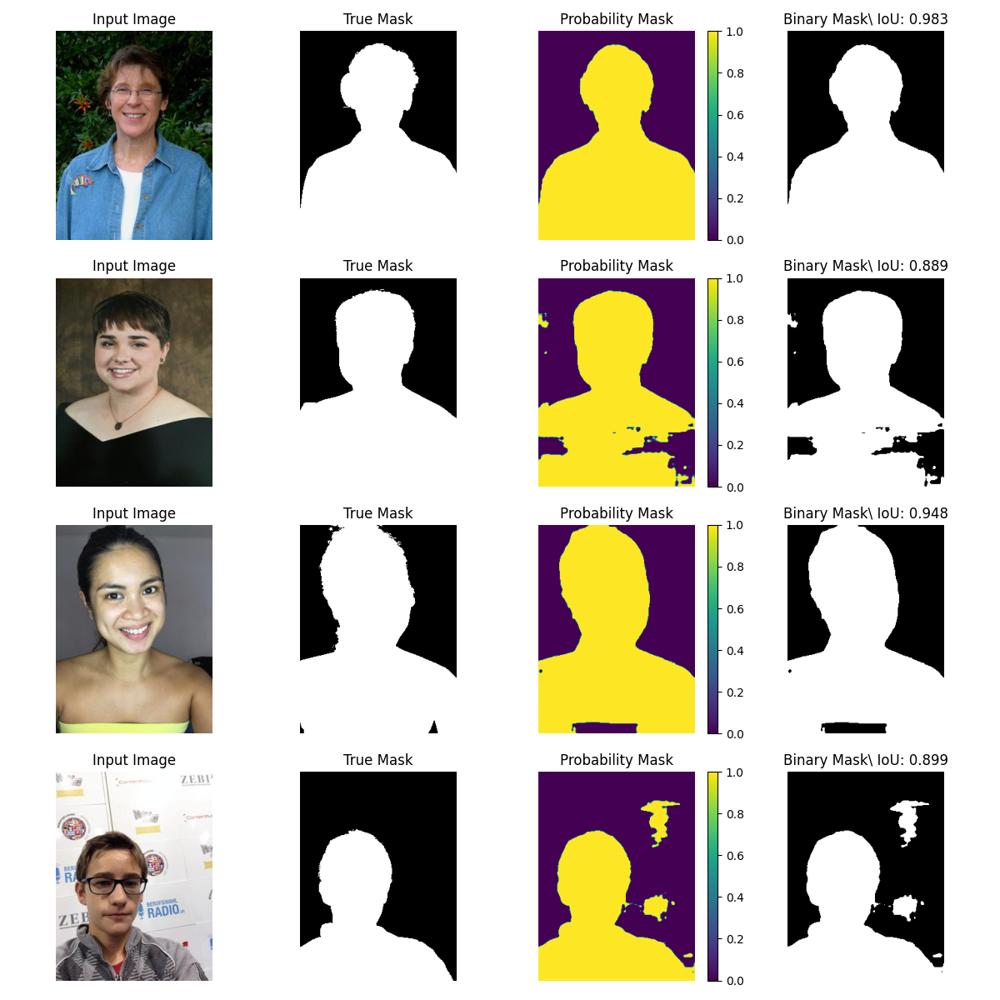

Cross-entropy loss

In [ ]:
config_entropy = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 30,
    'batch_size'     : 8,
    'loss'           : torch.nn.BCEWithLogitsLoss(),
    'threshold'      : 0.7,
    'name'           : 'UNet_only_entrpopy'
}

In [29]:
net = UNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

In [30]:
train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config_entropy,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
Epoch 30/30: 100%|██████████| 169/169 [00:49<00:00,  3.40it/s]


eval/DiceCoeff,▃▁▅▆▇▇▆█▇▇▇▇█▇▆█▇█▆█▇▇█▇████▇▇
eval/IoU,▂▁▅▆▆▇▅█▇▇▇▆▇▇▆█▇█▆█▇▇█▇████▆▇
eval/loss,█▆▄▅▃▂▄▁▃▂▁▂▂▂▂▁▂▂▂▃▃▃▃▄▂▄▄▅▇▅
grad_norm/decoder.blocks.0.conv1.bias,▃▃▂▅▄▂▂▂▂▁▅▃▃▁▂▂▁▂▂▁▂▂▄▁▅▁▃▂▂▃▂▁█▂▃▁▃▄▅▁
grad_norm/decoder.blocks.0.conv1.weight,▆▄▃▇▆▃▆█▅▆▅▃▃▃▂▃▂▁▃▂▂▂▆▂▂▁▃▂▁▅▂▂▂▁▂▁▂▂▁▃
grad_norm/decoder.blocks.0.conv2.bias,▁▂▂▄▆▄▂▂▂▂▁▁▁▃▂▂▁▄▁▄▁▂▁▃█▁▂▂▁▄▂▂▂▁▁▁▁▁▂▅
grad_norm/decoder.blocks.0.conv2.weight,▂▄▃▆▄▄█▄▂▆▆▂▄▂▂▂▂▁▄▁▂▁▃▂█▂▂▂▂▁▁▁▂▁▂▁▁▁▁▄
grad_norm/decoder.blocks.0.upconv.bias,▁▂▃▃▅▃▂▂▁█▁▃▂▂▃▂▂▆▃▂▂▆▂▁▂▁▃▂▂▃▁▁▃▂▂▁▁▁▁▂
grad_norm/decoder.blocks.0.upconv.weight,▆▄▃█▇▃▄▃▂▃▂▂▇▂▃▂▄▁▃▂▃▆▁▂▂▃▂▂▂▁▂▃▁▂▂▁▂▁▁▂
grad_norm/decoder.blocks.1.conv1.bias,▁█▃▃▂▃▃▄▄▁▁▂▃▂▄▃▂▂▂▄▂▂▁▂▂▁▁▂▂▁▁▃▁▂▁▂▁▂▁▁
grad_norm/decoder.blocks.1.conv1.weight,▆█▄▇▃▃▆▅▁▂▂▂▂▂▃▂▂▁▂▂▂▁▂▁▃▁▁▁▁▁▁▁▁▁▂▁▁▃▃▂


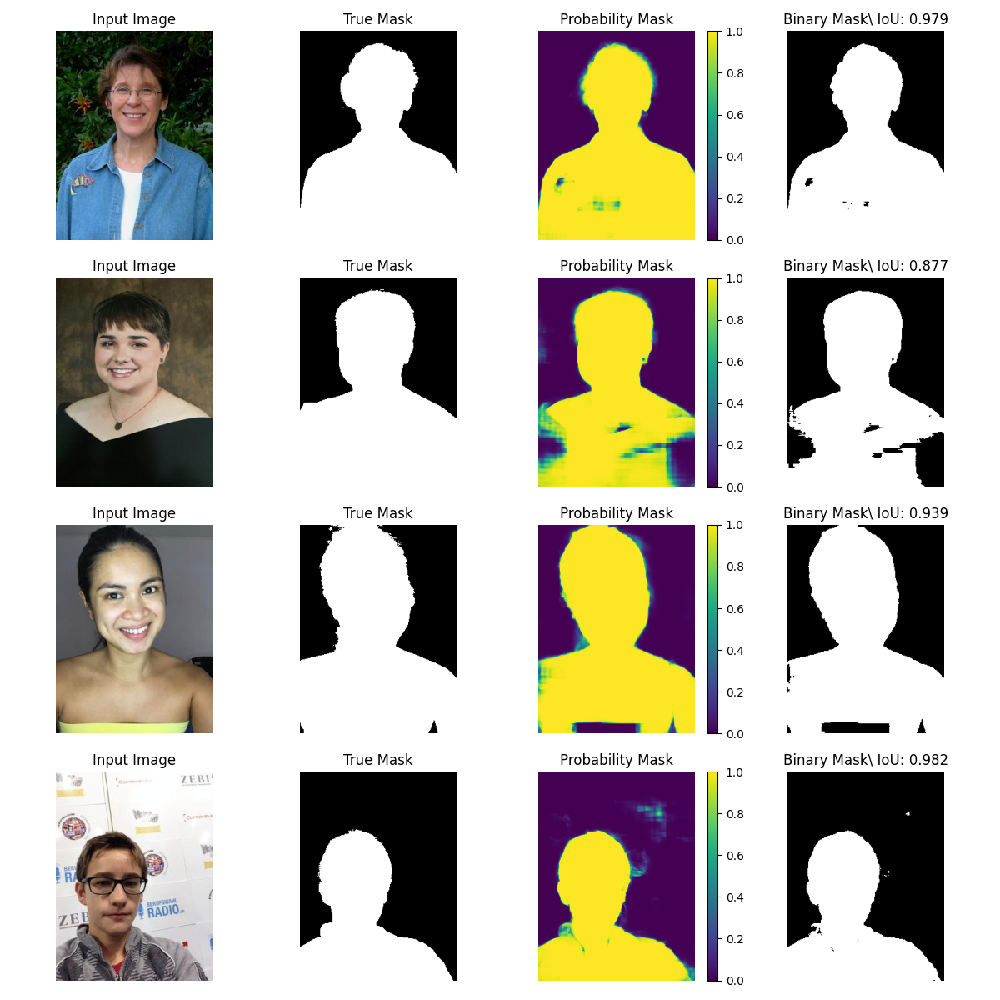

Комбинация функций потерь с весами

In [22]:
class CombinedLoss(torch.nn.Module):
    def __init__(self, weight_entropy, weight_dice):
        super().__init__()
        self.weight_entropy = weight_entropy
        self.weight_dice = weight_dice
        self.entropy = torch.nn.BCEWithLogitsLoss()
        self.dice = DiceLoss(reduction='mean')

    def forward(self, preds, targets):
        return self.weight_entropy * self.entropy(preds, targets) + self.weight_dice * self.dice(preds, targets)

In [23]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 30,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.5, 0.5),
    'threshold'      : 0.7,
    'name'           : 'UNet_Dice_Entropy_1to1'
}

net = UNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = tra![какой-то текст](base64 строка которую скопируйте с сайта)in_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
Epoch 30/30: 100%|██████████| 169/169 [00:50<00:00,  3.35it/s]


eval/DiceCoeff,▁▄▅▁▅▇▅▅▆▇▆█▇▇▆▇▇▆██▆▇▇▇█▇▇█▇▇
eval/IoU,▁▄▅▃▅▇▅▅▆▇▆▇▇▇▇▇▇▇██▆▇▇▇█▇▇█▇▇
eval/loss,█▃▄▄▄▂▂▃▁▁▁▁▂▁▁▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂
grad_norm/decoder.blocks.0.conv1.bias,▂▂▄▂▆▄▂▅▄▄▂█▄▃▆▃▂▃▄▂▁▂▂▂▂▁▃▄▂▃▁▃▄▂▂▁▃▁▂▁
grad_norm/decoder.blocks.0.conv1.weight,▃▃█▃▃▇▂▂▂▃▅▂▂▃▂▄▁▂▃▅▂▃▃▂▂▂▂▁▁▂▂▃▃▁▂▂▂▂▁▃
grad_norm/decoder.blocks.0.conv2.bias,▁▃▄█▅▆▃▄▂▂▂▂▄▁▂▂▄▂▄▂▃▅▅▂▆▂▂▂▂▂▁▆▂▂▃▄▆▁▁▁
grad_norm/decoder.blocks.0.conv2.weight,▄▂▅▄▂▄▂▇▁▂▂▃▃▂▃▄▂▂▁█▃▂▂▁▂▆▂▂▁▂▁▄▂▂▁▁▁▁▂▃
grad_norm/decoder.blocks.0.upconv.bias,▁▃▃▁▁▅▃▂▁▂▃▅▁█▁▃▄▂▁▁▂▅▁▄▁▇▅▃▅▄▂▂▃▂▂▃▃▁▃▆
grad_norm/decoder.blocks.0.upconv.weight,▁█▅▅▃▂▄▄▅▃▆▅▁▅▃▄▂▂▂▂▅▂▂▂▂▂▂▄▂▁▂▃▃▂▂▃▂▁▂▂
grad_norm/decoder.blocks.1.conv1.bias,▁▄▃▁▂▇▃▃▁▁▁▁▆▂▁▁▃▁▃█▃▁▅▁▅▂▆▃▁▅▁▁▅▁▄▂▃▁▁▂
grad_norm/decoder.blocks.1.conv1.weight,▄▄▃▆▅▃▆▄▃▃▃▂▅▂▂█▂▃▂▂▂▂▃▂▂▂▃▂▂▁▁▃▂▂▂▁▁▁▂▂


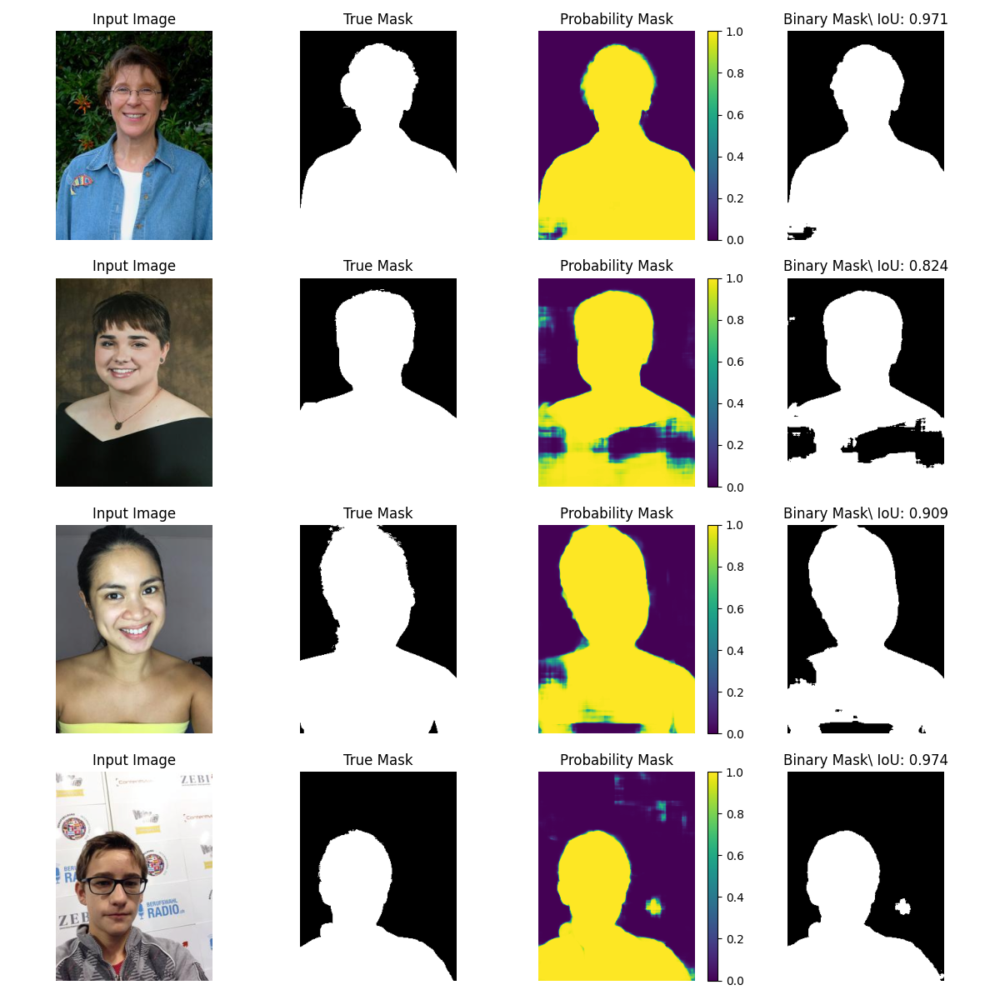

In [25]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.25, 0.75),
    'threshold'      : 0.7,
    'name'           : 'UNet_Entropy_Dice_1to3'
}

net = UNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
Epoch 20/20: 100%|██████████| 169/169 [00:50<00:00,  3.33it/s]


eval/DiceCoeff,▁▂▅▆▆▇▇▆▄█▇▇█▇█▇▇▇█▇
eval/IoU,▁▂▅▆▆▇▇▆▄█▇▇█▇█▇▇▇█▇
eval/loss,▇█▃▃▃▂▁▂▃▁▂▁▁▁▁▂▁▁▁▂
grad_norm/decoder.blocks.0.conv1.bias,▃▁▂▃▂▂▂▂▂▃▂▄▂▁▁▃▁▂█▁▂▃▃▁▁▂▄▄▁▁▂▁▁▂▂▁▃▂▁▁
grad_norm/decoder.blocks.0.conv1.weight,▂▂▃▄▃▂▅▂▂▂█▂▄▂▂▁▃▂▁▂▂▂▂▂▁▂▂▂▂▁▂▂▁▁▂▂▁▂▂▁
grad_norm/decoder.blocks.0.conv2.bias,▂▃▂▂▄▅▅█▃▅▄▃▁▁▂▃▄▂▂▃▁▃▂▂▁▄▂▃▅▅▂▁▂▁▇▄▄▂▃▂
grad_norm/decoder.blocks.0.conv2.weight,▂█▂▅▂▁▂▃▁▂▁▄▂▃▁▁▃▂▂▄▁▁▂▁▁▄▁▂▄▂▅▁▂▁▂▁▃▂▁▂
grad_norm/decoder.blocks.0.upconv.bias,▂▃▂▂▃▅▃▂▂▃▂▄▂▄▁▂▂▂▅▆▃▁▁▁▂▂▂▅▁▁▂▄▂▁▃▂█▁▄▅
grad_norm/decoder.blocks.0.upconv.weight,▂▃▅▃█▃▄▄▄▃▃▂▂▁▂▃▆▃▃▁▂▃▂▄▃▅▂▃▃▂▃▂▂▁▂▂▁▃▁▁
grad_norm/decoder.blocks.1.conv1.bias,▇▃▁▇▂▅▄▄▁▂█▂▃▃▂▆▂▆▂▁▄▃▂▂▇▃▂▆▂▆▃▄▃▆▃▅▂▂▄▆
grad_norm/decoder.blocks.1.conv1.weight,▃▃▂▂▁▁▄▃██▃▃▂▁▂▄▂▂▂▃▃▂▄▃▃▁▂▁▂▃▁▂▂▁▂▁▂▁▁▁


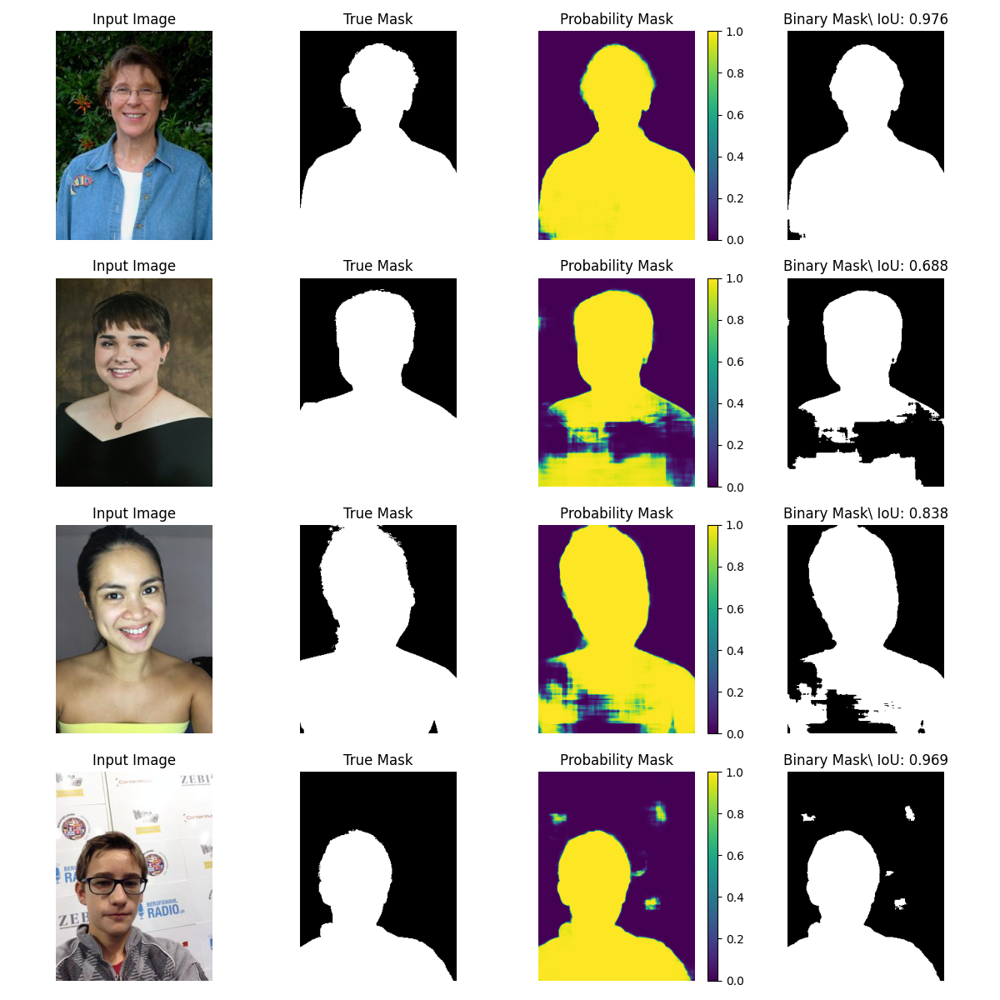

In [26]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.75, 0.25),
    'threshold'      : 0.7,
    'name'           : 'UNet_Entropy_Dice_3to1'
}

net = UNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
Epoch 20/20: 100%|██████████| 169/169 [00:50<00:00,  3.34it/s]


eval/DiceCoeff,▁▄▄▆▄▄▆▆▇▇▇▇▆██▆▇▇█▇
eval/IoU,▁▃▄▆▄▄▆▆▇▇▇▇▆██▆▇▇█▇
eval/loss,▆▅▃▂█▆▂▂▂▃▁▃▂▁▁▃▂▂▂▂
grad_norm/decoder.blocks.0.conv1.bias,▂▂▄▆▃▂▂▁▁▁▄▁▁▂▄▃█▃▁▃▂▂▂▃▃█▂▃▂▂▂▃▂▂▂▂▂▁▂▁
grad_norm/decoder.blocks.0.conv1.weight,▄▅▇▆▅▅▆▄▆▅█▁▂▄▅▂▃▂▄▁▃▄▂▄▄▂▂▁▂▂▂▁▂▁▃▂▂▃▂▂
grad_norm/decoder.blocks.0.conv2.bias,▂▁▅▂▆▁▅▁▅▂▁▄▄▇█▅▃▂▂▄▂▁▅▅▆▂▄▁▂▂▁▄▁▂▃▂▃▂▂▁
grad_norm/decoder.blocks.0.conv2.weight,▁▃▁▃▂▂█▄▂▇▃▃▅▅▃▂▃█▄▆▂▃▃▄▅▂▂▄▅▃▃▃▃▂▃▂▃▆▂▂
grad_norm/decoder.blocks.0.upconv.bias,▁▂▁▃▁▄▁▄▁▂▂▁▂▁█▃▂▂▂▂▂▄▃▂▃▅▂▂▁▂▁▁▃▁▃▂▁▁▂▁
grad_norm/decoder.blocks.0.upconv.weight,█▂▅▂▃▂▂▁▂▁▅▁▂▂▃▁▂▂▂▂▁▅▁▂▂▁▁▁▂▂▁▃▃▃▁▁▁▁▃▁
grad_norm/decoder.blocks.1.conv1.bias,▅▃▂▁▄▆▂▃▂▃▂▂█▁▂▆▂▂▁▁▄▂▂▆▅▃▂▄▂▃▃▃▂▅▃▂▃▁▂▃
grad_norm/decoder.blocks.1.conv1.weight,▆▃▃█▂▃▂▅▃▂▃▃▂▂▂▂▂▂▂▃▁▂▂▂▂▂▂▂▄▂▂▁▃▂▁▁▁▄▂▁


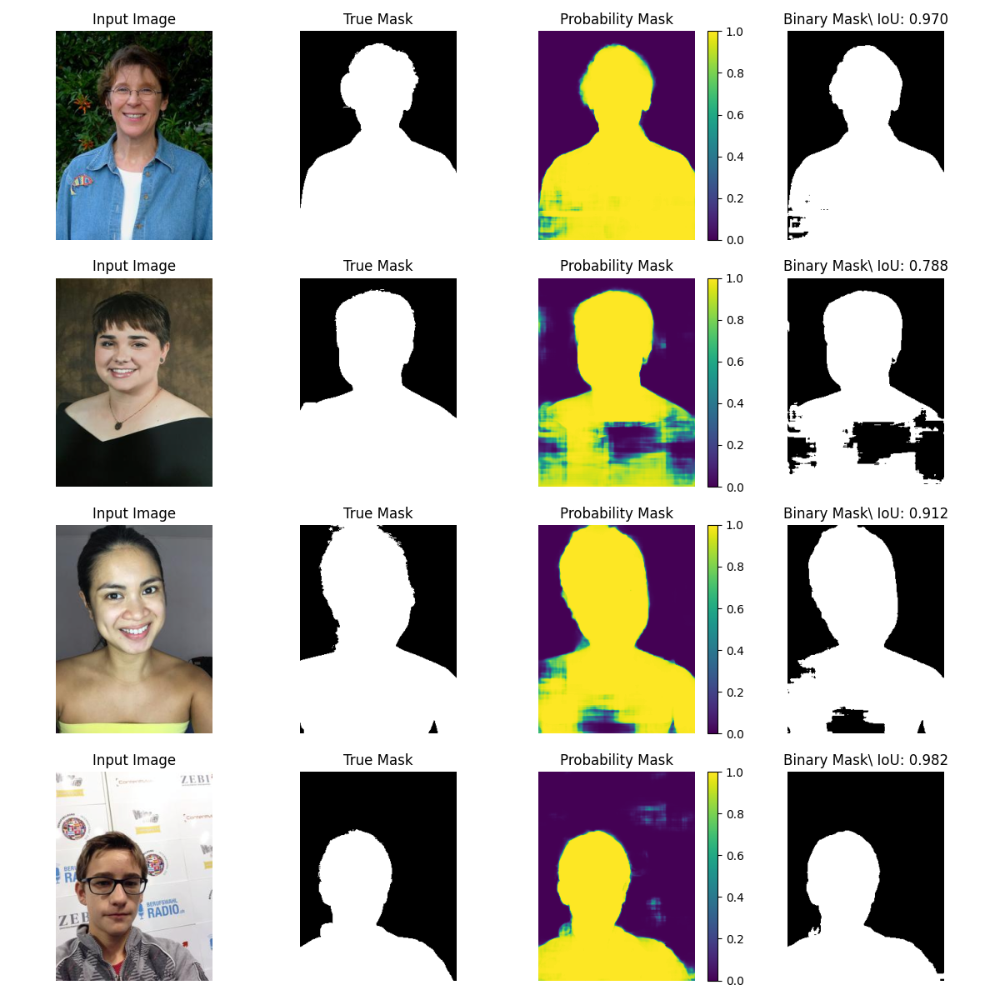

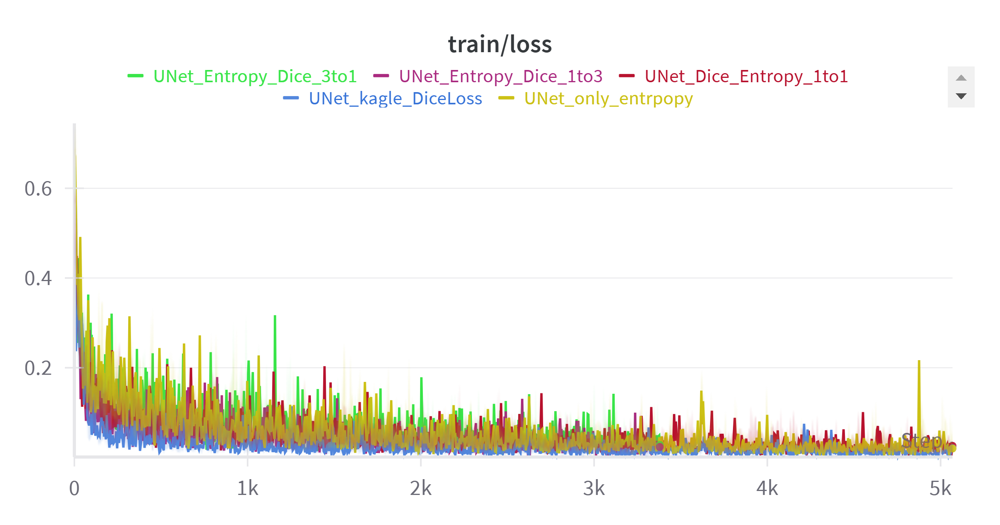

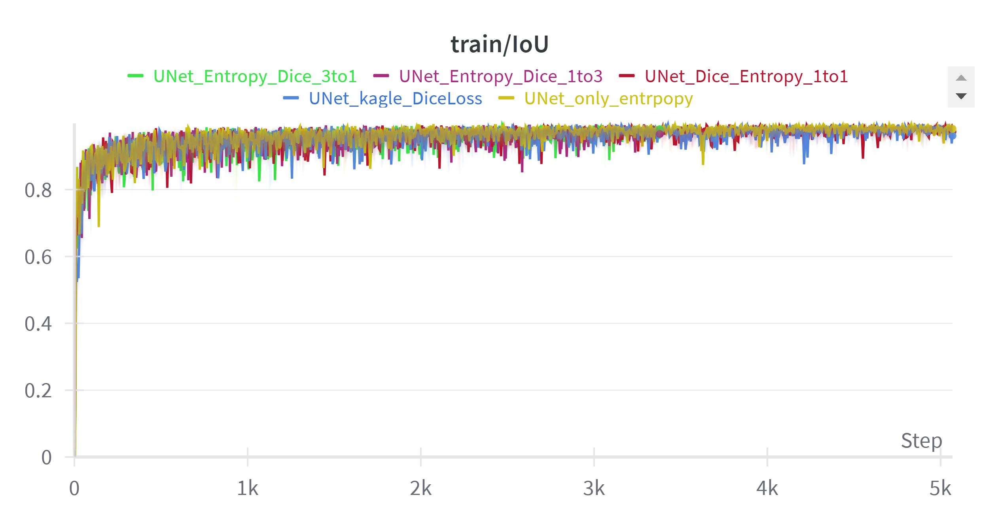

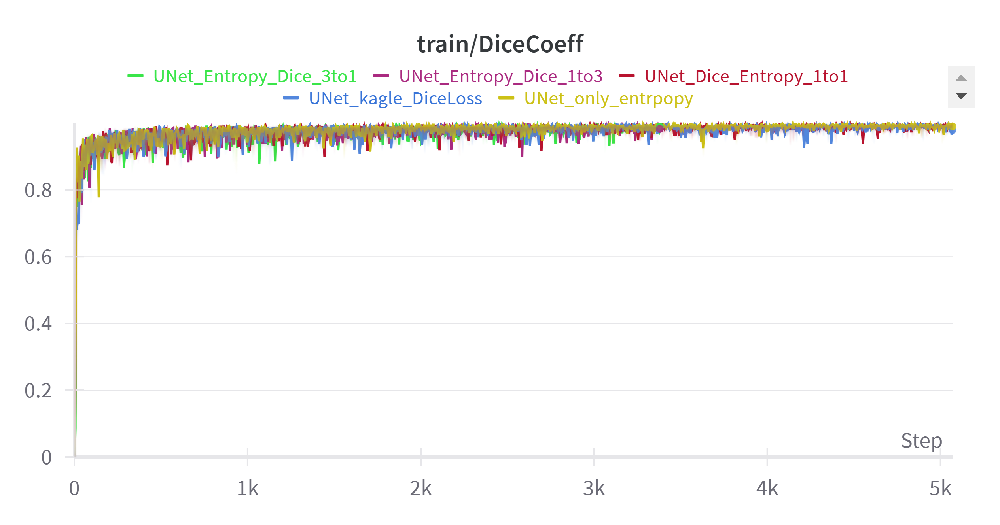

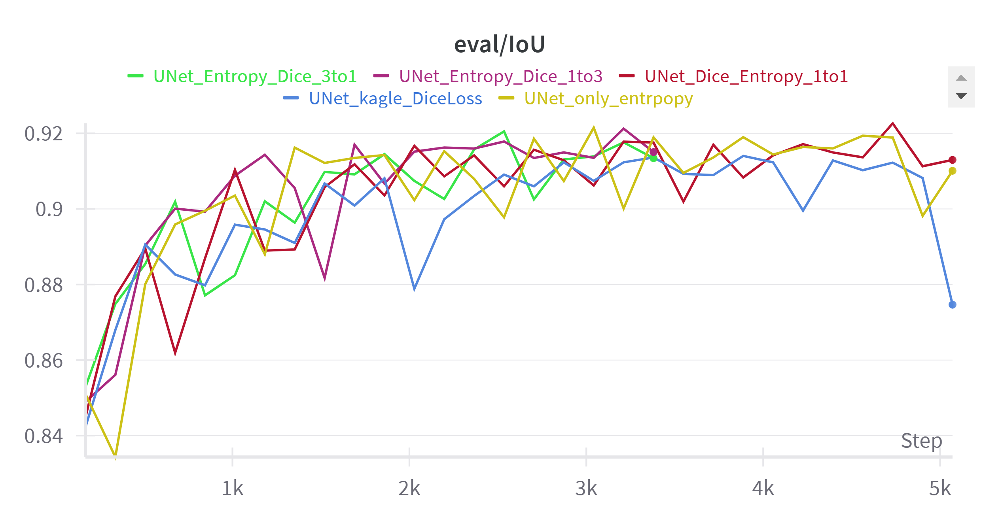

**Выводы:**

Некоторые модели обучались 30 эпох, остальные 20. Лучшее максимальное IoU на тесте (0.9226) показала модель с комбинированной функцией потерь с равными весами 0.5. При использовании других комбинированных функций потерь, а также кросс-энтропии были получены схожие результаты (0.915+ IoU). Немного хуже и менее стабильный график IoU на тесте был получен при использовании DiceLoss. По визуальным результатам работы моделей с различными функциями потерь заметно, что модели обученные на DiceLoss или с большим весом данной функции более уверены в своих предсказаниях (заметно по небинаризованным маскам, маленькие переходы между фоном и сегментом человека). DiceLoss показал наименьшие колебания при обучении, энтропия - наибольшие. Таким образом, наилучшее качество можно достичь при комбинации двух лоссов с правильно подобранными весами. DiceLoss будет делать предсказания более уверенными, но кросс - энтропия будет смегчать этот эффект и уменьшать "дыры" и другие артефакты в изображениях. Как метрику лучше использовать IoU нежели DiceCoeff, хотя они практически идентичны, но DiceCoeff "переоценивает" модели.

## `LinkNet (2 балла)`

Реализуйте архитектуру [LinkNet](https://arxiv.org/pdf/1707.03718.pdf) с использованием энкодера, основанного на `VGG13`. Архитектура похожа на `Unet`, но вместо конкатенации слоёв используются skip-connections (сложения). Для реализации достаточно переписать структуру декодировщика из предыдущего пункта.

*Подсказка:* так как конкатенации слоёв заменили на skip-connections, то ожидается, что число параметров стало меньше.

**Обучите сеть и проведите анализ согласно предыдущему пункту. Сравните LinkNet и U-Net по качеству и скорости работы. Сделайте выводы.**

In [23]:
class DecoderBlockLink(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = torch.nn.ReLU()

    def forward(self, down, left):
        # Upsample x2 и свёртка
        # your code here
        x = torch.nn.functional.interpolate(down, scale_factor=2, mode="nearest")
        x = self.upconv(x)

        # Skip-connection выхода энкодера и предыдущего блока декодера
        # your code here
        x = x + left

        # Две свёртки с ReLu
        # your code here
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.relu(x)

        return x

In [24]:
class DecoderLink(torch.nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        self.blocks = torch.nn.ModuleList()
        for idx in range(num_blocks):
            self.blocks.insert(0, DecoderBlockLink(num_filters * 2 ** idx))

    def forward(self, acts):
        up = acts[-1]
        for block, left in zip(self.blocks, acts[-2::-1]):
            up = block(up, left)
        return up

In [25]:
class LinkNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_blocks=4):
        super().__init__()
        # your code here
        self.encoder = VGG13Encoder(num_blocks)

        # your code here
        self.decoder = DecoderLink(64, num_blocks - 1)

        # Свёртка 1x1 для попиксельной агрегации каналов
        # your code here
        self.final = torch.nn.Conv2d(
            in_channels=64, out_channels=1,
            kernel_size=1)
    def forward(self, x):
        # your code here
        x = self.encoder.forward(x)
        x = self.decoder.forward(x)
        x = self.final(x)

        return x

In [27]:
model = LinkNet(num_classes=1, num_blocks=3)

print(sum((param.numel() for param in model.parameters())))
model

1883329


LinkNet(
  (encoder): VGG13Encoder(
    (blocks): ModuleList(
      (0): Sequential(
        (0): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU()
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): ReLU()
        )
      )
      (1): Sequential(
        (0): Sequential(
          (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (6): ReLU()
          (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (8): ReLU()
        )
      )
      (2): Sequential(
        (0): Sequential(
          (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (11): ReLU()
          (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (13): ReLU()
        )
      )
    )
  )
  (decoder): DecoderLink(
    (blocks): ModuleList(
      (0): DecoderBlockLink(
        (upconv): Con

In [33]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : DiceLoss(reduction='mean'),
    'threshold'      : 0.7,
    'name'           : 'LinkNet_Dice'
}

net = LinkNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
Epoch 20/20: 100%|██████████| 169/169 [00:44<00:00,  3.80it/s]


eval/DiceCoeff,▁▄▅▅▅▇▇▇▄▇▆▇█▇▇███▇█
eval/IoU,▁▄▄▅▅▇▇▇▄▇▆▇█▇▇█████
eval/loss,█▅▄▄▄▂▂▂▅▂▄▂▁▂▂▁▁▁▂▁
grad_norm/decoder.blocks.0.conv1.bias,▁▂▂▃▄█▃▆▂▅▄▂▁▁▃▂▅▂▂▁▁▂▆▄▁▃▃▃▂▄▃▂▆▃▅▂▂▁▁▅
grad_norm/decoder.blocks.0.conv1.weight,▂▄▂▅▇▄▅█▅▅▂▄▄▃▄▃▅▆▃▃▄▃▇▄▁▄▃▃▃▃▃▃▃▃▂▂▄▂▃▂
grad_norm/decoder.blocks.0.conv2.bias,▁▄▇▅▆▂▅▅▄▁█▃▂▂▁▁▅▄▂▂▂▃▁▁▄▂▂▁▃▇▁▂▅▄▂▃▂▆▃▄
grad_norm/decoder.blocks.0.conv2.weight,▁▄▄▂▂▂▂▄▂▇▃▄▃▂▂▁▃▂▄▂▅█▂▂▂▂▁▃▅▄▂▂▂▃▃▃▂▄▄▂
grad_norm/decoder.blocks.0.upconv.bias,▁▁▂▅▃▆▃▃▄▆▆▂▃▂▃▆▂▄▂▁▇▁▅▂█▅▄▂▆▄▂▄▂▄▁▁▅▅▃▃
grad_norm/decoder.blocks.0.upconv.weight,▁▂▂▇▄▂▅█▃▄▂▇▃▃▁▄▄▃▂▄▃▃▃▃▂▅▄▂█▃▁▂▄▂▄▃▄▂▂▃
grad_norm/decoder.blocks.1.conv1.bias,▂▁▁▂▂▁▂▁▁▂▃▅▃▂▂▁▂▃▇▄▅▄▄▁▂▃▅▅▁▃▂▂▃▃█▂▃▂▂▂
grad_norm/decoder.blocks.1.conv1.weight,▂▁▃▂▂▁▃▃▅▂▃▂█▂▂▂▂▂▃▄▂▅▁▂▂▂▂▄▂▂▁▁▄▁▃▂▂▂▁▂


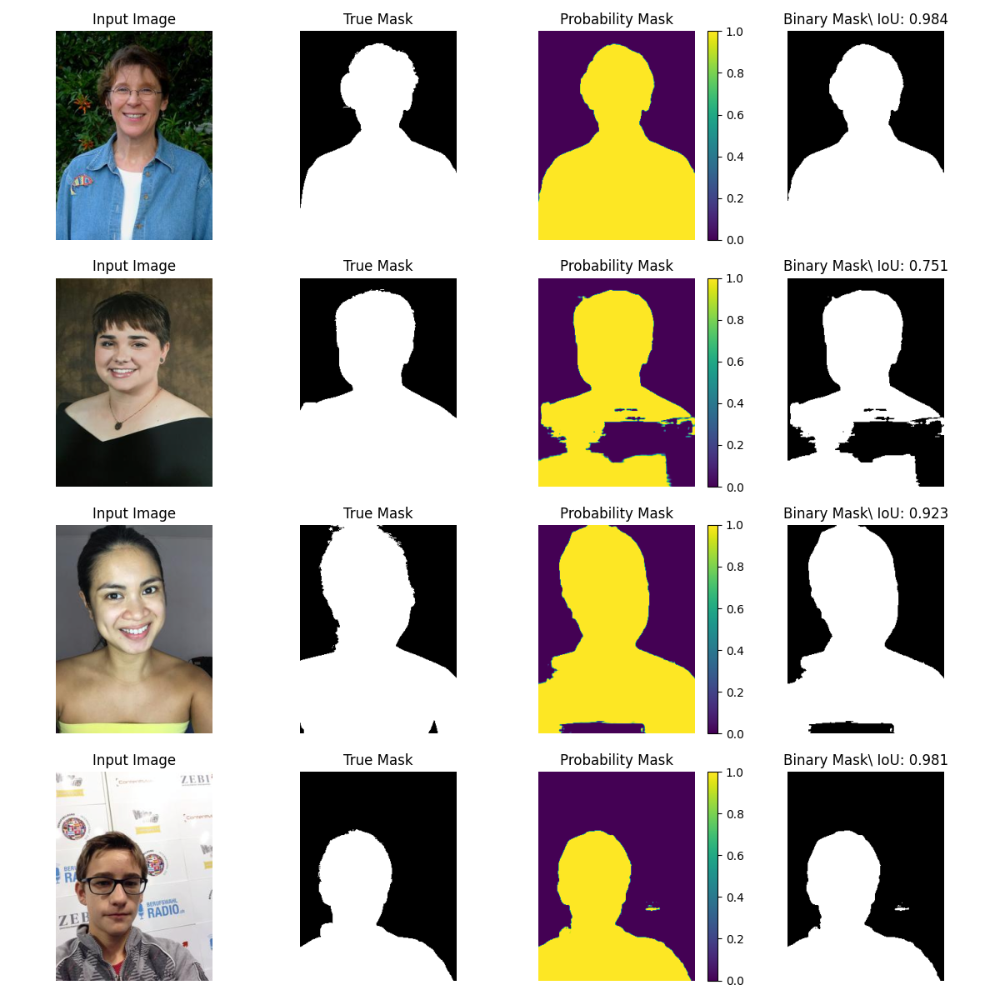

In [29]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : torch.nn.BCEWithLogitsLoss(),
    'threshold'      : 0.7,
    'name'           : 'LinkNet_Entropy'
}

net = LinkNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
Epoch 20/20: 100%|██████████| 169/169 [00:44<00:00,  3.80it/s]


eval/DiceCoeff,▁▃▅▆▆▇▅▅▇██▇█▇█▇██▅█
eval/IoU,▁▄▅▆▆▇▆▅▇████▇█▇██▅█
eval/loss,█▅▃▄▂▃▂▂▄▂▂▁▁▂▂▁▃▂▄▂
grad_norm/decoder.blocks.0.conv1.bias,▁▃▃▂█▂▃█▄▇▂▃▂▂▂▂▂▃▄▄▃▃▂▄▄▄▇▂▁▁▂▇▃▂▁▁▁▃▁▂
grad_norm/decoder.blocks.0.conv1.weight,▁▃█▂▄█▂▄▂▂▁▂▂▃▂▂▂▂▂▁▂▃▂▁▂▂▂▂▂▁▁▂▁▂▁▁▁▂▂▁
grad_norm/decoder.blocks.0.conv2.bias,▂▁▄▂█▄▂▂▂▃▂▂▆▄▁▁▁▄▂▂▃▁▁▁▁▃▁▂▂▂▄▁▁▁▁▂▂▁▃▂
grad_norm/decoder.blocks.0.conv2.weight,▅▁▂▁▃▆▄▂▃▂▃▂▁▄▁▁▂▄▂▃▂▂▂▂▁▁▃▁▁▂█▁▂▁▁▂▁▂▁▁
grad_norm/decoder.blocks.0.upconv.bias,▁▄▁▅▁▃▅▂▃▃▂▃▂▂▁▂▁▃▂▄▄▄▃▂▁▂▃▂▁▄▂▁▂█▃▁▁▂▆▂
grad_norm/decoder.blocks.0.upconv.weight,█▃▂█▂▁▂▄▁▄▄▁▃▂▅▄▃▂▂▁▂▂▂▃▁▂▇▂▁▁▁▃▂▁▁▂▁▂▂▁
grad_norm/decoder.blocks.1.conv1.bias,▁▂▁▃▃▂▃▂▂▄▁▂▁▂▂▂▁▂▂▁▁█▃▁▄▁▁▁▃▄▁▁▂▂▁▁▂▃▁▂
grad_norm/decoder.blocks.1.conv1.weight,█▅▁▄▄▂▂▄▅▄▂▃▄▂▃▂▂▃▁▂▁▂▁▂▂▂▂▂▃▂▁▂▂▁▁▄█▁▂▃


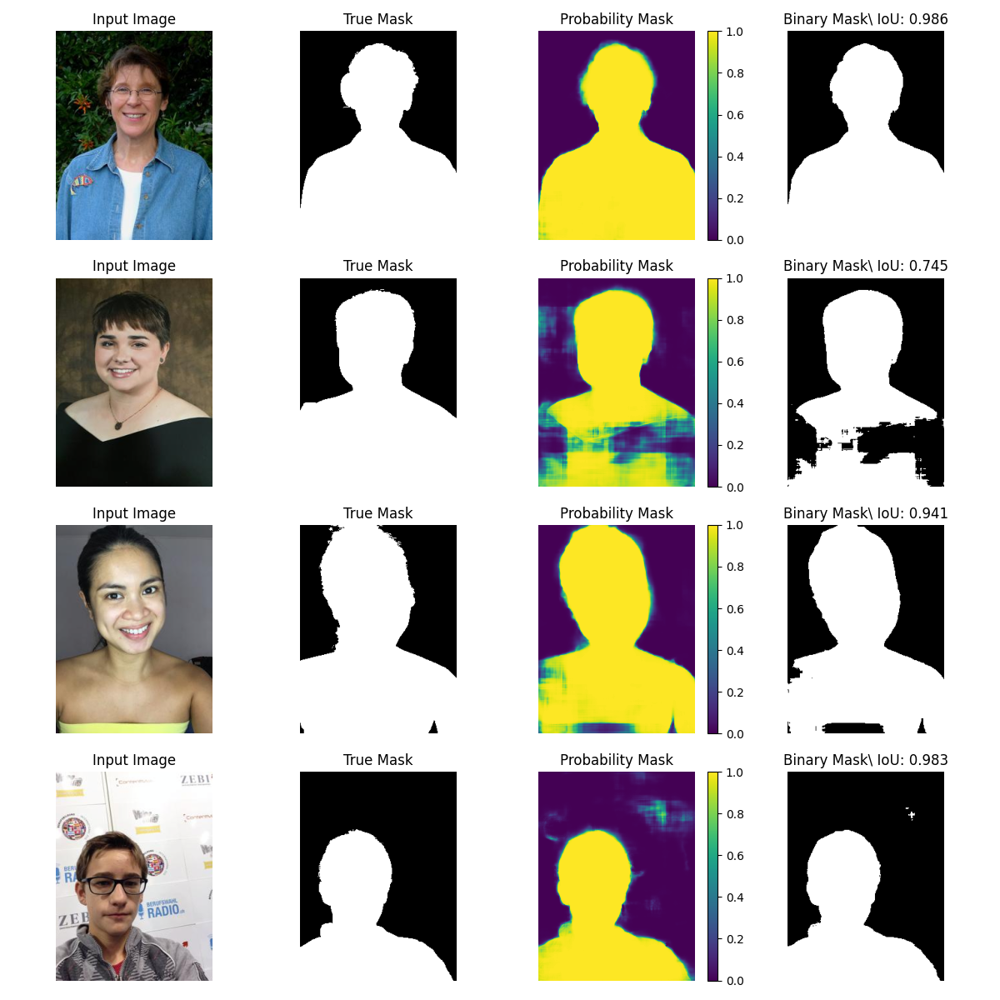

In [32]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.5, 0.5),
    'threshold'      : 0.7,
    'name'           : 'LinkNet_Dice_Entropy_1to1'
}

net = LinkNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
Epoch 20/20: 100%|██████████| 169/169 [00:44<00:00,  3.78it/s]


eval/DiceCoeff,▁▆▆▆▇▇▇▇█▇███▇▇███▇█
eval/IoU,▁▆▆▆▇▇▇▇█▇▇██▇▇███▇█
eval/loss,█▄▃▄▃▂▃▂▁▂▃▁▁▂▄▂▂▂▃▁
grad_norm/decoder.blocks.0.conv1.bias,▃▃▁▁▂▂▁▁▃▁▅▄▅▃▄▁▁▂▃▂▂▁█▁▁▁▂▂▂▂▁▂▂▂▁▁▁▁▂▂
grad_norm/decoder.blocks.0.conv1.weight,▄▅▄▃▂▄▃▄▃▆▅▄▃▂▃▂▃▆▃▅▄▂▅▃▃▂▅▄█▃▂▁▂▂▂▃▁▃▄▂
grad_norm/decoder.blocks.0.conv2.bias,▂▂▁▃▂▄▆▇▁▃▂▃▃▁▃▁▂▂▅▂▅▂▂▃▂▃▂▁▂▁▂▁▁▄▄▂█▁▁▂
grad_norm/decoder.blocks.0.conv2.weight,▂▃▁▂▁▂▄▂▆▃▁█▁▁▁▅▂▂▁▂▂▂▃▂▁▂▁▂▂▃▃▁▁▁▂▁▁▃▁▁
grad_norm/decoder.blocks.0.upconv.bias,▁▁▂▂▅▁▆▃▄▁▁▂▃▁▆▂▃▃▁▄▂▃▇▅▁▆▃▃▁▃▄▂█▅▄▅▂▃▆▄
grad_norm/decoder.blocks.0.upconv.weight,▃▃▂▂▂▂▂▂▁▃▁▄█▁▁▂▂▃▂▂▃▂▁▁▁▁▁▂▁▂▂▂▁▅▂▁▂▁▃▁
grad_norm/decoder.blocks.1.conv1.bias,▄▄▅▁▅▂▂▁▃▃▁▂▂▂▃▃▂▄▁▃▃▁▁▁▄▃▂▂▁▁▄▂█▂▂▂▃▁▃▁
grad_norm/decoder.blocks.1.conv1.weight,█▄▃▂▅▄▄▂▁▂▂▂▂▃▂▁▂▇▂▂▁▃▂▂▁▁▂▂▁▃▂▁▁▃▂▁▁▁▂▂


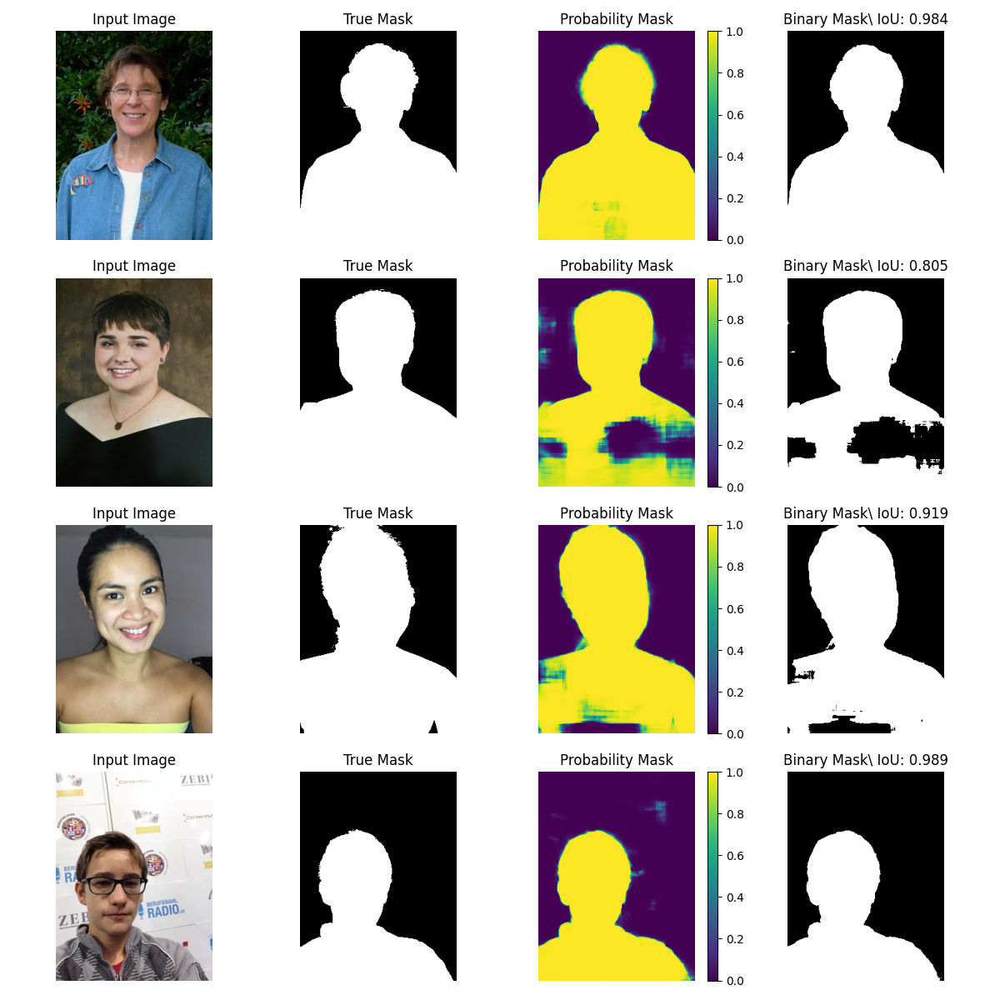

In [ ]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.25, 0.75),
    'threshold'      : 0.7,
    'name'           : 'LinkNet_Entropy_Dice_1to3'
}

net = LinkNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
Epoch 1/20:  30%|██▉       | 50/169 [00:13<00:30,  3.86it/s]

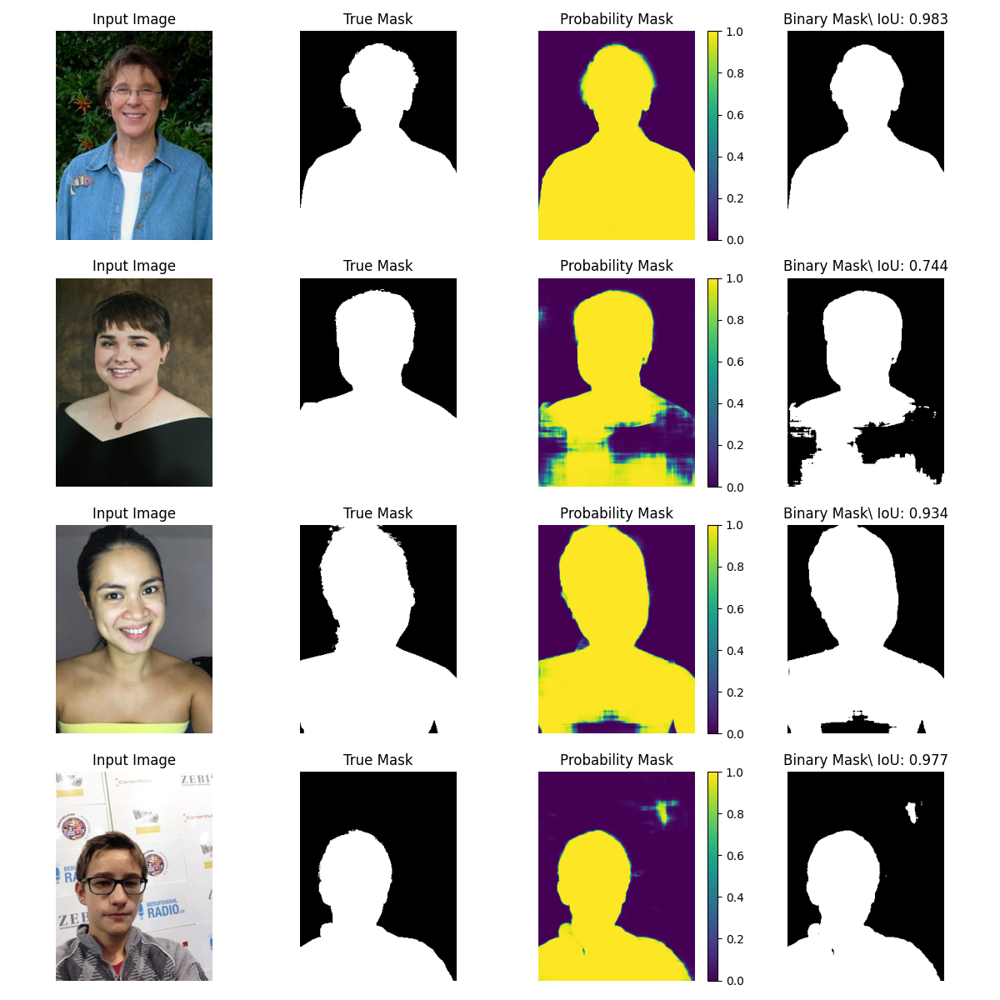

In [26]:
config = {
    'num_blocks'     : 4,
    'lr'             : 1e-4,
    'epoch_num'      : 20,
    'batch_size'     : 8,
    'loss'           : CombinedLoss(0.75, 0.25),
    'threshold'      : 0.7,
    'name'           : 'LinkNet_Entropy_Dice_3to1'
}

net = LinkNet(num_classes=1, num_blocks=4)
optimizer = optim.Adam(net.parameters(), lr=config['lr'])

train_wandb_eval(
    net              = net,
    optimizer        = optimizer,
    config           = config,
    train_dataloader = train_data_loader,
    valid_dataloader = test_data_loader,
    device           = device,
)

wandb: WARNING No relevant files were detected in the specified directory. No code will be logged to your run.
Epoch 20/20: 100%|██████████| 169/169 [00:44<00:00,  3.78it/s]


eval/DiceCoeff,▁▄▁▆▂▇▇▇▇▇▅▄█▇▇█▇▇██
eval/IoU,▁▃▂▆▃▇▇▆▇▇▅▄█▇▇█▇▇██
eval/loss,█▅▄▃▄▁▂▃▁▂▂▃▂▁▂▁▂▃▂▂
grad_norm/decoder.blocks.0.conv1.bias,▂▂▁▂▃▂▂▂█▂▂▂▁▃▃▃▂▂▂▁▂▁▂▂▁▁▂▃▆▂▅▃▂▁▃▃▂▃▂▁
grad_norm/decoder.blocks.0.conv1.weight,▇▆▆▃█▃▂▂▂▃▁▃▃▃▅▅▃▆▃▂▆▆▃▁▅▃▃▁▂▂▂▂▂▁▁▂▂▁▆▁
grad_norm/decoder.blocks.0.conv2.bias,▂▃▃▃█▂▂▅█▂▂▄▆▂▁▆▁▂▁▂▁▁▂▃▃▃▃▂▄▅▁▂▁▁▂▄▆▁▁▃
grad_norm/decoder.blocks.0.conv2.weight,▅█▂▁▃▂▂▃▁▂▂▃▄▂▂▃▁▅▂▁▃▂▁▂▂▁▂▃▂▁▁▁▁▂▁▂▁▁▂▁
grad_norm/decoder.blocks.0.upconv.bias,▂▄▂▂▃█▃▂▂▁▄▁▄▂▁▂▂▁▂▃▂▂▃▃▂▁▃▂▂▁▁▃▂▃▁▃▁▂▂▃
grad_norm/decoder.blocks.0.upconv.weight,▆▄▄▃▄▂▃▄▂▂▃▁▇▃▂▂▂▂▁▁▁▁▃▁▃▂▂▁▁█▂▂▂▁▂▁▁▂▂▂
grad_norm/decoder.blocks.1.conv1.bias,▁▇▂▂▂▃▂▂▂▂▂▂▁▂▂▁█▂▁▃▄▃▄▄▃▄▁▂▃▁▁▂▃▂▃▁▂▁▂▄
grad_norm/decoder.blocks.1.conv1.weight,▃▃▇▂▂▃▁▂▂▂▁▄▁█▂▂▂▁▂▂▂▁▃▁▂▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁


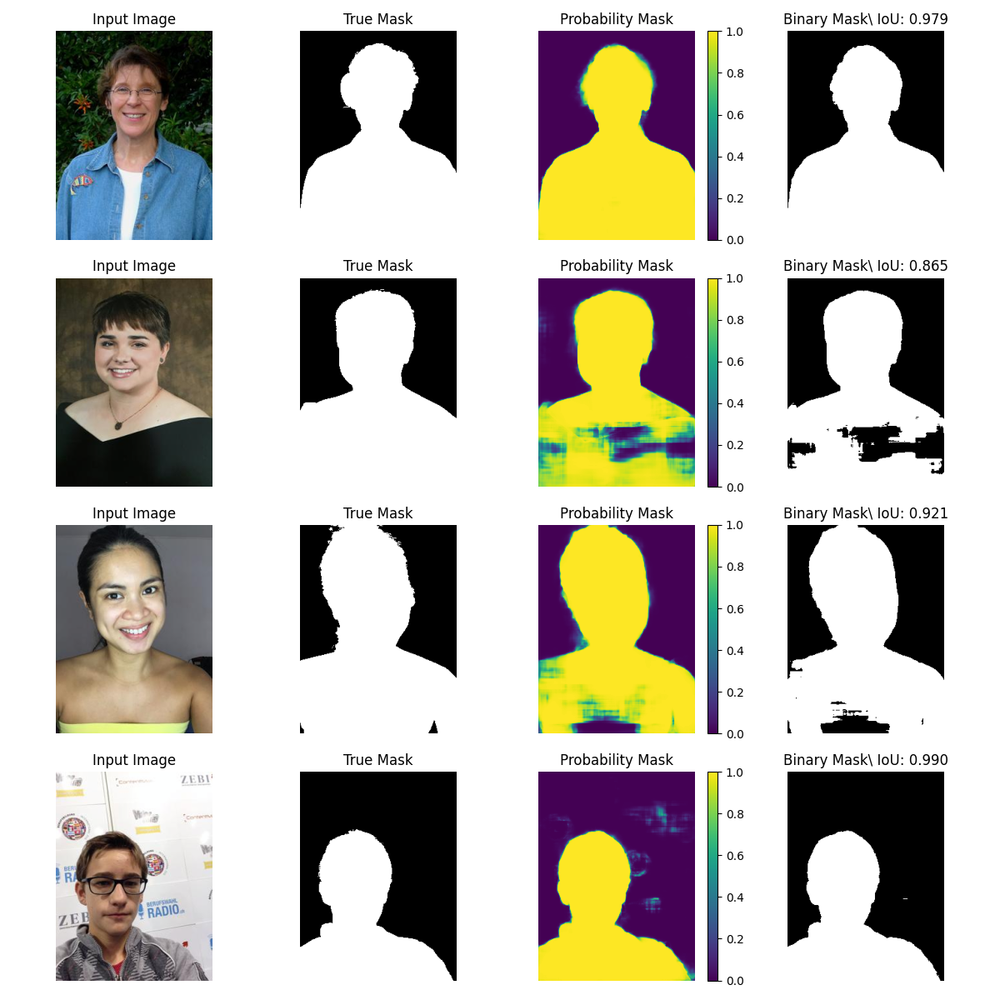

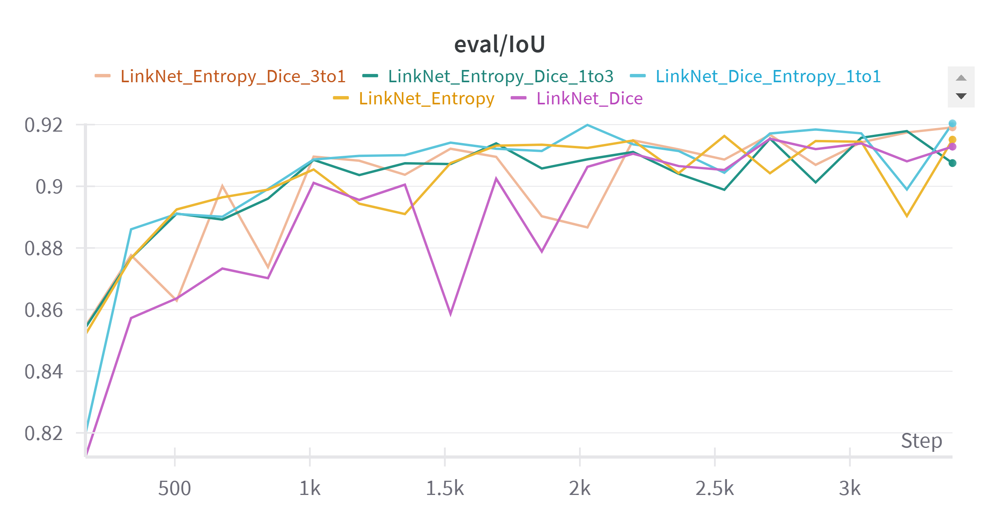

!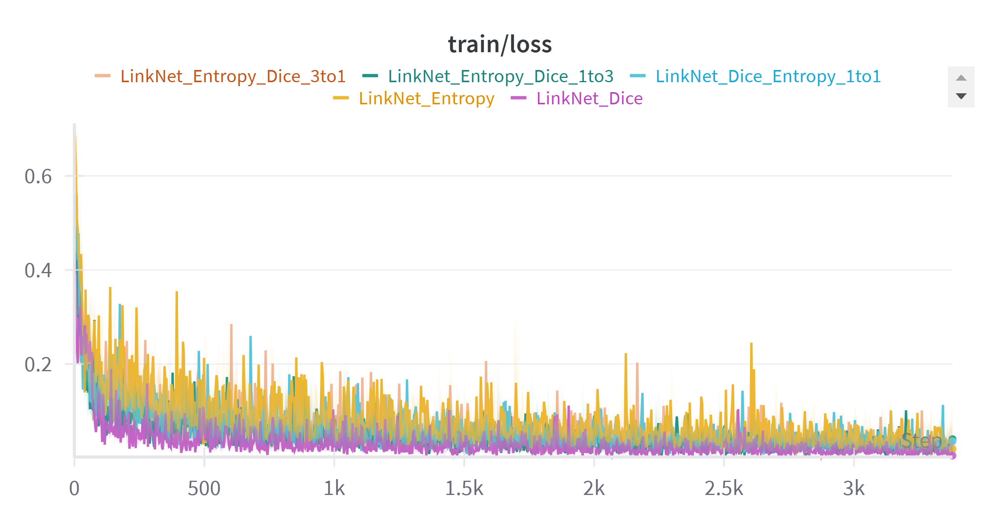

!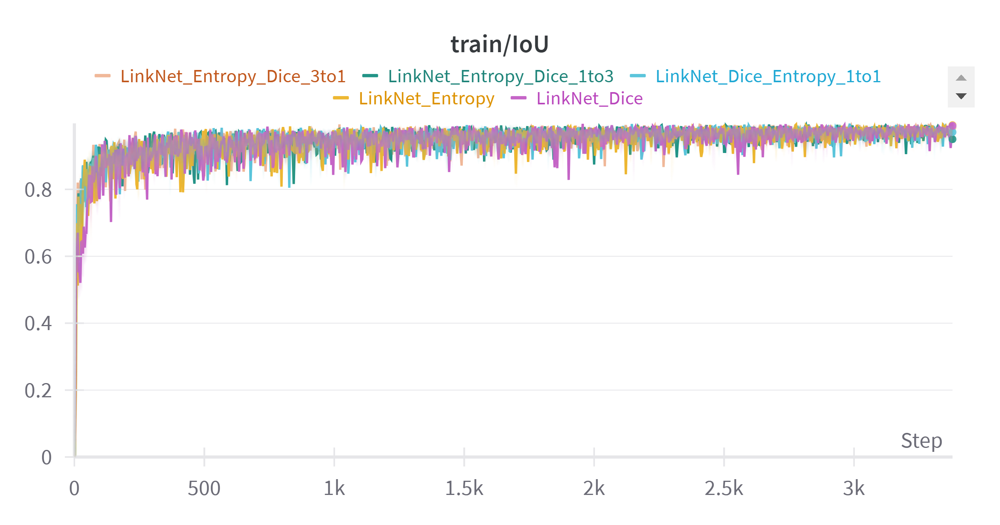

Выводы: при обучении и тестировании LinkNet мы видим похожую на UNet картину. Лучше всего себя показала комбинированная функция потерь с весами 0.5. Она достигла 0.92 IoU. При использовании остальных функций потерь результаты немного хуже, но при этом они держутся в диапозоне 0.915+. Модели с DiceLoss, как и в случае с UNet требуется больше эпох для джостижения наилучшего качества, также график IoU на тесте нестабилен. Все свойства функций потерь сохранились при изменении архитектуры. При этом LinkNet обучается в среднем на 5-7 секунд на эпоху быстрее UNet, что логично (меньше параметров), хотя и немного проигрывает в качестве (разница 0.02 в IoU). Дисперсия значений лоссов при обучении у LinkNet выше. Абсолютные значения разных функций потерь между собой не совсем корректно сравнивать, так как они имеют разную природу, что сказывается на постоянной разнице значений.


Таккже визуально на изображениях заметно, что LinkNet лучше справляется с внешними артефактами, нежели UNet.
Таким образом, можно сделать вывод что более лёгкая LinkNet при использовании комбинированной функции потерь обучается быстрее, лучше справляется с артефактами на масках и показывает схожее качество с более медленным UNet.

## `Теоретические вопросы (1 балл)`

### `Вопрос 1`
* Сформулируйте два предположения о структуре входных данных, на которые опирается архитектура свёрточных сетей.
* Какие преимущества дает использование сверток в случае, если эти предположения верные?
* Приведите пример входных данных, когда эти предположения не выполняются.

Первое предположение:
Свёрточные нейронные сети выделяют локальные признаки, то есть они опираются на то, что близкие пиксели сильнее скоррелированы и содержат важные локальные признаки.

Второе предположение:
При использовании свёрточных нейронных сетей предпологается, что расположение признаков не имеет значения – если объект немного сместится на изображении, сеть все равно должна его распознать.

Преимущества:


* Свёртки позволяют распознавать объекты в разных местах изображения, что делает сеть более обобщающей
* Благодаря свойству локальности данных свёртки хорошо обучаются находить такие важные локальные признаки как текстуры и границы
* Одна и та же свёртка (по параметрам) применяется к различным частям изображениям, что позволяет сократить количество обучаемых параметров по сравнению с полносвязными сетями.


Пример:

Например, табличные входные данные. Соседние столбцы могут отвечать за незавимые признаки, которые могут быть никак не связаны. Также в таких данных перестановка столбцов - признаков может не изменять смысл, что делает предположение о локальности бессмсленным. А сдвиги в данных могут совершенно поменять смысл информации. при таких входных данных свёрточные нейронные сети будут не эффективны для извлечения признаков.

### `Вопрос 2`
Пусть дано множество 1-D входов ${x^{(i)} \in \mathbb{R}^{100}}$.

Рассмотрим полносвязный слой ${f(\cdot)}$, заданный как ${f(x^{(i)}) = \sigma(Wx^{(i)})}$, где ${W}$ - матрица весов размерности ${1000\times 100}$ и ${\sigma(\cdot)}$ поэлементая функция активации.

Рассмотрим также сверточный слой ${g(\cdot)}$ с десятью картами признаков: ${g(x^{(i)}) = \sigma([z_1, z_2,...,z_{10}])}$, где ${z_j = x^{(i)}\ast w_j}$ для некоторого ядра свертки ${w_j}$ с размером 3 и паддингом 1. Для ${f(\cdot)}$ и ${g(\cdot)}$ напишите:

1. Размерность выходного пространства.
2. Количество обучаемых параметров.
3. Число операций при выполнении forward pass (при условии наивной реализации перемножения матриц и вычисления сверток).

**Ответ:**

1. В $f(.)$ размерность ($Wx^{(i)}$)  =  $1000\times 1$, сигмоида не меняет размерности, следовательно, размерность выходного пространства $1000\times 1$

   В $g(.)$ используется паддинг = 1, поэтому размерность выходного пространства не отличается от входного. Размерность = $100\times 10$

2. Для $f(.)$ количество обучаемых параметров $f$ равно количеству весов в $W$, то есть $1000 * 10 = 100 000$
    
   Для $g(.)$ количество обучаемых параметров $g$ равно 10 сверток $\times$ 3 параметра, то есть 30 параметров

4. В $f(.)$ для одного $x^{(i)}$ потребуется 100 умножений + 99 сложений = 199 операций, а таких  $x^{(i)}$ таких операция $1000$. Функция активации действует на каждый элемент. Всего в итоге $199000 *  \text{(кол-во операций для функции активации)}$

   В $g(.)$ одна свёртка выполняется за 5 операций (3 умножения и 2 сложения) и применяется к каждому элементу вектора. Следовательно, $5 * 10 * 100 = 5000$ операций. Функция активации применяется к элементам матрицы $100\times 10$. Всего операций = $5000 + 1000 * \text{(кол-во операций для функции активации)}$






## `Бонус: постобработка изображений (1 балл)`

В предложенной задаче на фотографиях необходимо сегментировать только центральное изображения. Артефакты, которые появляются на краях изображения, можно удалять с помощью постобработки (например, с помощью модуля [skimage.morphology](https://scikit-image.org/docs/dev/api/skimage.morphology.html)).

Реализуйте какой-нибудь из методов постобработки, дающий прирост в качестве. Продемонстрируйте несколько изображений, на которых постобработка будет оказывать влияние на результат сегментации.

## `Бонус: существенное улучшение качества (2 балла)`

Придумайте какой-нибудь трюк, который существенно (с учётом бонусного пункта 1) повысит качество (которое должно быть и так достаточно высоко). Не разрешается использовать дополнительные данные или другие предобученные кодировщики кроме VGG13.

Если вы что-то попробовали, но качество не повысилось, всё равно оформите этот пункт, даже за неудачные попытки могут быть начислены баллы.

## `Бонус: обучение с использованием сторонних фреймворков (1 балл)`

Попробуйте обучить свою модель с использованием одного из следующих фреймворков: [catalyst](https://github.com/catalyst-team/catalyst), [pytorch-lightning](https://www.pytorchlightning.ai/), [ignite](https://github.com/pytorch/ignite).

## `Бонус: аугментации (0.5 балла)`

Воспользуйтесь сторонними библиотеками для аугментаций, например, [deepaugment](https://github.com/barisozmen/deepaugment) и [albumentations](https://albumentations.ai/) для улучшения качества модели.

## `Бонус: torch.compile (0.25 балла)`

Попробуйте установить [Pytorch 2.0](https://pytorch.org/get-started/pytorch-2.0/) и запустите обучение с использованием `torch.compile`. Тщательно сравните время с и без использованием компиляции.

*Замечание:* обязательно укажите конфигурацию системы (версия OS, модель CPU/GPU, объём RAM), на которой производилось обучение. В частности, приложите вывод команд:
```bash
! nvcc --version
! nvidia-smi
```